In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from pathlib import Path
import numpy as np
import h5py
from tqdm.auto import tqdm, trange
import scipy.io
import time
import torch
import random
import math
import shutil
from sklearn.decomposition import PCA
import scipy as sp
import scipy.signal
import os
import pandas as pd
from torch import nn
from scipy.spatial.distance import cdist

from analysis.proj import learn_manifold_umap, pca_train, pca
from analysis.plotting import plot_gmm, plot_closest_spikes
from analysis.contrastive_utils import load_GPT_backbone
from analysis.cluster import GMM, HDBSCAN
from sklearn.mixture import GaussianMixture
from sklearn.metrics import adjusted_rand_score
from analysis.cluster import MeanShift
from analysis.benchmarking import class_scores, avg_score, per_class_accs, avg_class_accs
import matplotlib.patheffects as pe

from spike_psvae.denoise import SingleChanDenoiser

import colorcet as cc
def get_ccolor(k):
    if k == -1:
        return "#808080"
    else:
        return ccolors[k % len(ccolors)]
ccolors = cc.glasbey[:31]

ModuleNotFoundError: No module named 'analysis.contrastive_utils'

In [ ]:
import matplotlib.pyplot as plt
# %matplotlib inline
plt.rc("figure", dpi=100)
SMALL_SIZE = 8
MEDIUM_SIZE = 10
BIGGER_SIZE = 12
plt.rc('font', size=SMALL_SIZE)
plt.rc('axes', titlesize=MEDIUM_SIZE)
plt.rc('axes', labelsize=SMALL_SIZE)
plt.rc('xtick', labelsize=SMALL_SIZE)
plt.rc('ytick', labelsize=SMALL_SIZE)
plt.rc('legend', fontsize=SMALL_SIZE)
plt.rc('figure', titlesize=BIGGER_SIZE)

## Load Data

In [55]:
import MEArec as mr
data_base_dir = Path('/moto/stats/users/ch3676/datasets_contrastive_ephys/')
data_type = Path('single_channel/DY016_random_neurons')
data_name = Path('dy016_random_neurons_04_28_2023')
data_path = data_base_dir / data_type / data_name

In [56]:
unit_ids = np.load(data_path / 'unit_ids.npy')
spikes_train = np.load(data_path / 'spikes_train.npy')
spikes_test = np.load(data_path / 'spikes_test.npy')
labels_test = np.load(data_path / 'labels_test.npy')
labels_train = np.load(data_path / 'labels_train.npy')
selected_units = np.load(data_path / 'selected_units.npy')

## Set PCA params

In [57]:
if len(spikes_train.shape) == 2:
    print("single channel waveforms")
    num_chan_pca = 1
    is_multi_chan = False
else:
    print("multi-channel waveforms")
    is_multi_chan = True

single channel waveforms


## Denoise

In [58]:
denoised_wfs_train = []
denoised_wfs_test = []

wfs_train = spikes_train.copy()
wfs_test = spikes_test.copy()

denoiser = SingleChanDenoiser()
denoiser.load('/moto/home/ch3676/spike-psvae/pretrained/single_chan_denoiser.pt')

for i in range(len(wfs_train)):
    curr_wf = wfs_train[i]
    with torch.no_grad():
        if not is_multi_chan:
            curr_wf = torch.unsqueeze(torch.from_numpy(curr_wf), dim=0)
            den_wf = denoiser(curr_wf)
        else:
            den_wf_ch_list = []
            for wf_ch in curr_wf:
                wf_ch = torch.unsqueeze(torch.from_numpy(wf_ch), dim=0)
                den_wf_ch = denoiser(wf_ch)
                den_wf_ch_list.append(den_wf_ch)
            den_wf = torch.concatenate(den_wf_ch_list)
        denoised_wfs_train.append(den_wf.squeeze().numpy())

denoised_wfs_train = np.array(denoised_wfs_train)
    
for i in range(len(wfs_test)):
    curr_wf = wfs_test[i]
    with torch.no_grad():
        if not is_multi_chan:
            curr_wf = torch.unsqueeze(torch.from_numpy(curr_wf), dim=0)
            den_wf = denoiser(curr_wf)
        else:
            den_wf_ch_list = []
            for wf_ch in curr_wf:
                wf_ch = torch.unsqueeze(torch.from_numpy(wf_ch), dim=0)
                den_wf_ch = denoiser(wf_ch)
                den_wf_ch_list.append(den_wf_ch)
            den_wf = torch.concatenate(den_wf_ch_list)
        denoised_wfs_test.append(den_wf.squeeze().numpy())
        
denoised_wfs_test = np.array(denoised_wfs_test)

In [60]:
# if not is_multi_chan:
#     num_extra_chans = 0
# else:
#     num_extra_chans = 5
    
# wfs_train = wfs_train[:,wfs_train.shape[1]//2-num_extra_chans:wfs_train.shape[1]//2+num_extra_chans+1,:]
# wfs_test = wfs_test[:,wfs_test.shape[1]//2-num_extra_chans:wfs_test.shape[1]//2+num_extra_chans+1,:]
# denoised_wfs_train = denoised_wfs_train[:,wfs_train.shape[1]//2-num_extra_chans:wfs_train.shape[1]//2+num_extra_chans+1,:]
# denoised_wfs_test = denoised_wfs_test[:,wfs_test.shape[1]//2-num_extra_chans:wfs_test.shape[1]//2+num_extra_chans+1,:]
# print(wfs_train.shape)
# print(wfs_test.shape)
# print(denoised_wfs_train.shape)
# print(denoised_wfs_test.shape)

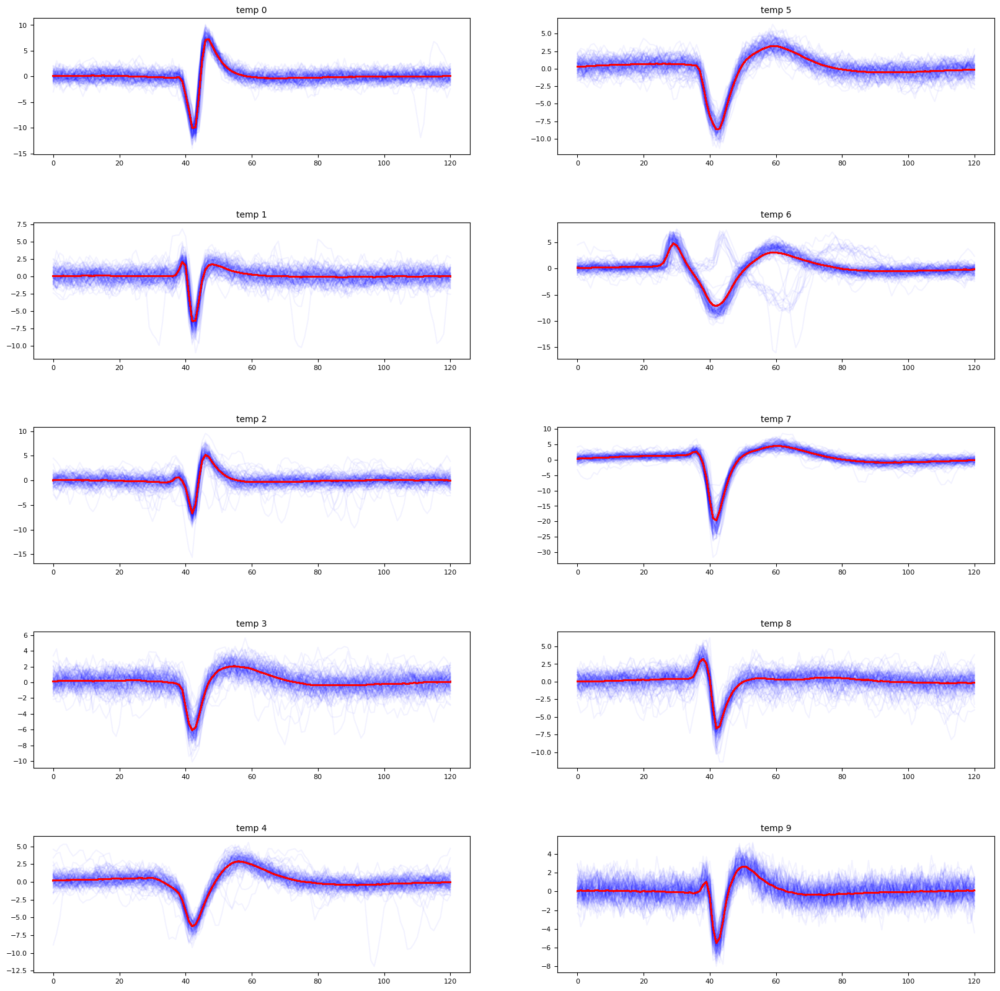

In [61]:
num_plot = 100
fig, axes = plt.subplots(5,2,figsize=(20,20))
for label_plot in range(len(np.unique(labels_train))):
    ax = axes[label_plot % 5][label_plot // 5]
    spikes = wfs_train[np.where(labels_train==label_plot)]
    for spike in spikes[:num_plot]:
        ax.plot(spike.flatten(), color='blue', alpha=.05)
        ax.plot(np.mean(spikes, 0).flatten(), color='red')
    ax.set_title(f'temp {label_plot}')
fig.subplots_adjust(hspace=0.5)
plt.show()

In [62]:
# num_plot = 100
# fig, axes = plt.subplots(5,2,figsize=(20,20))
# for label_plot in range(len(np.unique(labels_test))):
#     ax = axes[label_plot % 5][label_plot // 5]
#     spikes = wfs_test[np.where(labels_test==label_plot)]
#     for spike in spikes[:num_plot]:
#         ax.plot(spike.flatten(), color='blue', alpha=.05)
#         ax.plot(np.mean(spikes, 0).flatten(), color='red')
#     ax.set_title(f'temp {label_plot}')
# fig.subplots_adjust(hspace=0.5)
# plt.show()

In [63]:
#compute PCA
wfs_train_mean = np.mean(np.array([wf.flatten() for wf in wfs_train]), axis=0)
wfs_train_norm = np.array([wf.flatten() for wf in wfs_train]) - wfs_train_mean
wfs_test_norm = np.array([wf.flatten() for wf in wfs_test]) - wfs_train_mean

denoised_wfs_train_mean = np.mean(np.array([wf.flatten() for wf in denoised_wfs_train]), axis=0)
denoised_wfs_train_norm = np.array([wf.flatten() for wf in denoised_wfs_train]) - denoised_wfs_train_mean
denoised_wfs_test_norm = np.array([wf.flatten() for wf in denoised_wfs_test]) - denoised_wfs_train_mean


n_comps = 5
std_scale = 1
pcs_train, _, _ = pca(wfs_train_norm, n_comps) * std_scale
pcs_test, pcs_ex_var  = pca_train(wfs_train_norm, wfs_test_norm, n_comps) * std_scale
denoised_pcs_train, _, _  = pca(denoised_wfs_train_norm, n_comps) * std_scale
denoised_pcs_test, denoised_pcs_ex_var = pca_train(denoised_wfs_train_norm, denoised_wfs_test_norm, n_comps) * std_scale

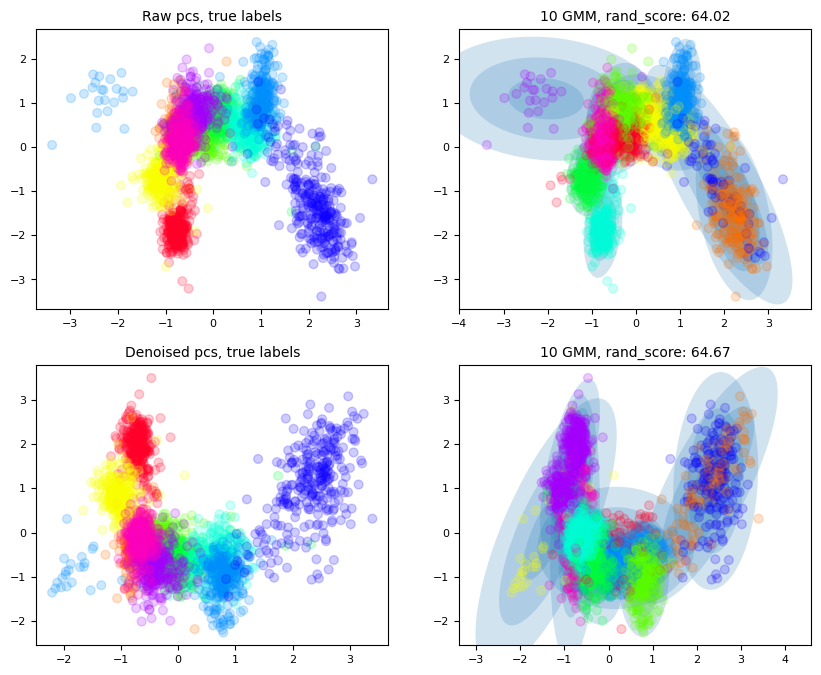

In [65]:
reps_train = pcs_train
reps_test = pcs_test

num_components = 5
covariance_type = 'full'
n_clusters = 10
pc_gmm = GaussianMixture(n_clusters, 
                         random_state=0, 
                         covariance_type=covariance_type).fit(reps_train[:,:num_components])
pc_test_labels = pc_gmm.predict(reps_test[:,:num_components])


reps_train = denoised_pcs_train
reps_test = denoised_pcs_test

num_components = 5
covariance_type = 'full'
n_clusters = 10
denoised_pc_gmm = GaussianMixture(n_clusters, 
                                  random_state=0, 
                                  covariance_type=covariance_type).fit(reps_train[:,:num_components])
denoised_pc_test_labels = denoised_pc_gmm.predict(reps_test[:,:num_components])

fig, axes = plt.subplots(2,2,figsize=(10,8))
X = pcs_test[:,:num_components]
score = adjusted_rand_score(labels_test, pc_test_labels)*100
row = 0
gmm = pc_gmm
axes[row][0].scatter(X[:, 0], X[:, 1], c=labels_test, s=40, cmap='gist_rainbow', zorder=2, alpha=.2)
plot_gmm(gmm, X, label=True, ax=axes[row][1])
axes[row][0].set_title('Raw pcs, true labels')
axes[row][1].set_title(f'10 GMM, rand_score: {np.round(score,2)}');

X = denoised_pcs_test[:,:num_components]
score = adjusted_rand_score(labels_test, denoised_pc_test_labels)*100
row = 1
gmm = denoised_pc_gmm
axes[row][0].scatter(X[:, 0], X[:, 1], c=labels_test, s=40, cmap='gist_rainbow', zorder=2, alpha=.2)
plot_gmm(gmm, X, label=True, ax=axes[row][1])
axes[row][0].set_title('Denoised pcs, true labels')
axes[row][1].set_title(f'10 GMM, rand_score: {np.round(score,2)}');

In [66]:
from models.model_GPT import Multi_GPT, Single_GPT, GPTConfig
from load_models import load_ckpt, get_dataloader

single_rep_dim = 5

#load checkpoint
if not is_multi_chan:
    path_to_checkpoint = Path(f'/moto/stats/users/ch3676/spike_single_models_0508/0507_repdim5_bs512_lr0.001_n32_addtrain_do0.0/')
else:
    path_to_checkpoint = Path('/moto/stats/users/ch3676/spike_ddp_models_0504/0502_mc_gpt_conseq_causal_nembd64_block1331_bs128_extra5_lr0.0001_knn10_addtrain/')
checkpoint_path = path_to_checkpoint / 'checkpoint.pth'

#load GPT backbone only
# model = load_GPT_backbone(model, checkpoint, is_multi_chan)
model = load_ckpt(checkpoint_path, multi_chan=is_multi_chan, single_rep_dim=single_rep_dim, 
                  pos_enc='conseq', rep_after_proj=False)
# if use_reps:
#     model.projector = nn.Identity()
#     model.online_head = nn.Identity()
model.eval(); 

Using projector; batchnorm False with depth 3; hidden_dim=512
number of parameters: 0.52M
missing keys []
unexpected keys ['projector.proj_block.0.weight', 'projector.proj_block.0.bias', 'projector.proj_block.2.weight', 'projector.proj_block.2.bias', 'projector.proj_block.4.weight', 'projector.proj_block.4.bias']


In [67]:
from data_aug.contrastive_learning_dataset import ContrastiveLearningDataset, WFDataset_lab
from data_aug import Crop

if not is_multi_chan:
    num_extra_chans = 0
else:
    num_extra_chans = 5
batch_size = 128
data_path = '/moto/stats/users/ch3676/datasets_contrastive_ephys/multi_channel/DY016_random_neurons/dy016_random_neurons_04_28_2023/'

train_dataset = WFDataset_lab(data_path, split='train', multi_chan=is_multi_chan, 
                             transform=Crop(prob=0.0, num_extra_chans=num_extra_chans, ignore_chan_num=True))
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, 
                                          shuffle=False, num_workers=10, 
                                          pin_memory=True, drop_last=False)

test_dataset = WFDataset_lab(data_path, split='test', multi_chan=is_multi_chan, 
                             transform=Crop(prob=0.0, num_extra_chans=num_extra_chans, ignore_chan_num=True))
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, 
                                          shuffle=False, num_workers=10, 
                                          pin_memory=True, drop_last=False)

False spikes_train.npy
(12000, 21, 121)
(3000, 21, 121)


In [68]:
# cont_reps_train = []
# with torch.no_grad():
#     for data, target in tqdm(train_loader):
#         if not is_multi_chan:
#             data = torch.squeeze(data, dim=1)
#             data = torch.unsqueeze(data, dim=-1)
#         else:
#             data = data.view(-1, 11*121)
#             data = torch.unsqueeze(data, dim=-1)
#         feature = model(data)
#         cont_reps_train.append(feature)
# cont_reps_train = torch.concatenate(cont_reps_train).numpy()

# cont_reps_test = []
# with torch.no_grad():
#     for data, target in tqdm(test_loader):
#         if not is_multi_chan:
#             data = torch.squeeze(data, dim=1)
#             data = torch.unsqueeze(data, dim=-1)
#         else:
#             data = data.view(-1, 11*121)
#             data = torch.unsqueeze(data, dim=-1)
#         feature = model(data)
#         cont_reps_test.append(feature)
# cont_reps_test = torch.concatenate(cont_reps_test).numpy()

In [82]:
# load representations
if not is_multi_chan:
    path_to_reps = Path('/moto/stats/users/ch3676/spike_single_models_0508/0507_repdim5_bs512_lr0.001_n32_addtrain_do0.0')
else:
    path_to_reps = Path('/moto/stats/users/ch3676/spike_ddp_models_0504/0502_mc_gpt_conseq_causal_nembd64_block1331_bs128_extra5_lr0.0001_knn10_addtrain/')

use_reps = False
if use_reps:
    cont_reps_train = torch.load(path_to_reps / 'train_reps.pt', map_location='cpu').numpy()
    cont_reps_test = torch.load(path_to_reps / 'test_reps.pt', map_location='cpu').numpy()
else:
    cont_reps_train = torch.load(path_to_reps / 'train_aftproj_reps.pt', map_location='cpu').numpy()
    cont_reps_test = torch.load(path_to_reps / 'test_aftproj_reps.pt', map_location='cpu').numpy()

In [83]:
from sklearn.mixture import GaussianMixture
import hdbscan
import numpy as np
from sklearn.metrics import adjusted_rand_score

# covariance_type : {'full', 'tied', 'diag', 'spherical'}
# reps_train = pcs_train
# reps_test = pcs_test
covariance_type = 'full'
n_clusters = 10
reps_train = cont_reps_train
reps_test = cont_reps_test
gmm_list_cont = []
num_components = np.arange(5, reps_train.shape[1]+1)
for num_c in num_components:
    gmm = GaussianMixture(n_clusters, 
                          random_state=0, 
                          covariance_type=covariance_type).fit(reps_train[:,:num_c])
    gmm_list_cont.append(gmm)
    gmm_cont_test_labels = gmm.predict(reps_test[:,:num_c])
    score = adjusted_rand_score(labels_test, gmm_cont_test_labels)*100
    print(f"num_comps: {num_c}, rand_score: {score}")

num_comps: 5, rand_score: 85.35037663788772


In [84]:
#visualize aug representations in 2D pca
pcs_train_cont, _, _ = pca(cont_reps_train, n_comps=2)
pcs_test_cont, _  = pca_train(cont_reps_train, cont_reps_test, n_comps=2)

In [85]:
# cont_test_umap = learn_manifold_umap(cont_reps_test, umap_dim=2, umap_min_dist=0.2, umap_metric='euclidean', umap_neighbors=10)
# clustering = MeanShift(bandwidth=2, n_jobs=20).fit(cont_test_umap)
# labels_test_ms = clustering.predict(cont_test_umap)
# score = adjusted_rand_score(labels_test, labels_test_ms)*100
# print(score)

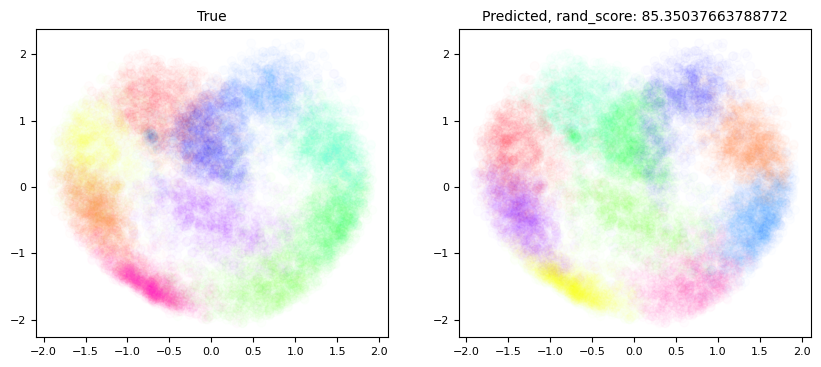

In [87]:
fig, axes = plt.subplots(1,2,figsize=(10,4))
X = pcs_train_cont
gmm = gmm_list_cont[-1]
train_labels = gmm.predict(cont_reps_train)
axes[0].scatter(X[:, 0], X[:, 1], c=labels_train, s=40, cmap='gist_rainbow', zorder=2, alpha=.05)
axes[1].scatter(X[:, 0], X[:, 1], c=train_labels, s=40, cmap='gist_rainbow', zorder=2, alpha=.05)
# plot_gmm(gmm, wfs_train_cont_numpy, label=True, ax=axes[1])
gmm_cont_test_labels = gmm.predict(cont_reps_test)
score = adjusted_rand_score(labels_test, gmm_cont_test_labels)*100
axes[0].set_title('True')
axes[1].set_title(f'Predicted, rand_score: {score}');

In [74]:
# from data_aug.contrastive_learning_dataset import ContrastiveLearningDataset, WFDataset_lab, WF_MultiChan_Dataset
# from data_aug import  AmpJitter, Jitter, Collide, SmartNoise, ToWfTensor, Crop
# from torchvision import transforms, datasets

# if not is_multi_chan:
#     num_extra_chans = 0
# else:
#     num_extra_chans = 5
# batch_size = 128
# data_path = '/moto/stats/users/ch3676/datasets_contrastive_ephys/multi_channel/DY016_random_neurons/dy016_random_neurons_04_28_2023/'

# # train_dataset = WFDataset_lab(data_path, split='train', multi_chan=is_multi_chan, 
# #                              transform=Crop(prob=0.0, num_extra_chans=num_extra_chans, ignore_chan_num=True))
# # train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, 
# #                                            shuffle=False, num_workers=10, 
# #                                            pin_memory=True, drop_last=False)

# crop_prob_list = [0.0, 0.1, 0.2, 0.3, 0.4, 0.5]
# p_collide_list = [0.0, 0.1, 0.2, 0.3, 0.4]
# cont_reps_test_aug_list = []
# aug_wfs_list = []
# for p_collide in p_collide_list:
#     print(p_collide)
#     # test_dataset = WFDataset_lab(data_path, split='test', multi_chan=is_multi_chan, 
#     #                              transform=Crop(prob=crop_prob, num_extra_chans=num_extra_chans, ignore_chan_num=True))
#     test_dataset = WFDataset_lab(data_path, split='test', multi_chan=is_multi_chan,
#                                  transform=transforms.Compose([transforms.RandomApply([Collide(data_path, multi_chan=is_multi_chan)], p=p_collide),
#                                                                Crop(prob=0.0, num_extra_chans=num_extra_chans, ignore_chan_num=True)]))
#     test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, 
#                                               shuffle=False, num_workers=10, 
#                                               pin_memory=True, drop_last=False)
#     # cont_reps_test_aug = []
#     aug_wfs = []
#     with torch.no_grad():
#         for data, target in tqdm(test_loader):
#             if not is_multi_chan:
#                 data = torch.squeeze(data, dim=1)
#                 data = torch.unsqueeze(data, dim=-1)
#             else:
#                 data = data.view(-1, 11*121)
#                 data = torch.unsqueeze(data, dim=-1)
#             # feature = model(data)
#             # cont_reps_test_aug.append(feature)
#             aug_wfs.append(data)
#     # cont_reps_test_aug = torch.concatenate(cont_reps_test_aug).numpy()
#     aug_wfs = torch.concatenate(aug_wfs).numpy()
#     # cont_reps_test_aug_list.append(cont_reps_test_aug)
#     aug_wfs_list.append(aug_wfs)

In [51]:
# #compute pcs for pca
# pcs_test_pcs, _  = pca_train(pcs_test, pcs_test, n_comps=2)
# denoised_pcs_test_pcs, _  = pca_train(denoised_pcs_test, denoised_pcs_test, n_comps=2)

In [52]:
# wf_id = 105
# plt.plot(aug_wfs_list[4][wf_id].flatten())
# plt.plot(aug_wfs_list[0][wf_id].flatten())

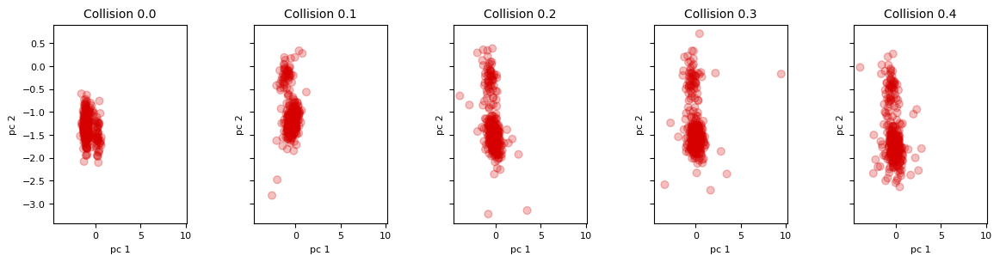

In [49]:
labels = labels_test
labels_plot = [0]
alpha = .25
indices = np.where(np.in1d(labels, labels_plot))[0]
fig, axes = plt.subplots(1,len(aug_wfs_list),figsize=(14,3), sharex=True, sharey=True)

for i, aug_wfs in enumerate(aug_wfs_list):
    #compute pcs for augmented waveforms
    aug_wfs_norm = np.array([wf.flatten() for wf in aug_wfs]) - wfs_train_mean
    aug_pcs_test, _  = pca_train(wfs_train_norm, aug_wfs_norm, n_comps=5)
    aug_pcs_test_pcs, _  = pca_train(aug_pcs_test, aug_pcs_test, n_comps=2)
    axes[i].scatter(aug_pcs_test_pcs[indices, 0], aug_pcs_test_pcs[indices, 1], c=[ccolors[i] for i in labels[indices]], s=40, zorder=2, alpha=alpha)
    axes[i].set_title(f'Collision {crop_prob_list[i]}');
    axes[i].set_xlabel('pc 1')
    axes[i].set_ylabel('pc 2')
fig.subplots_adjust(wspace=0.5)

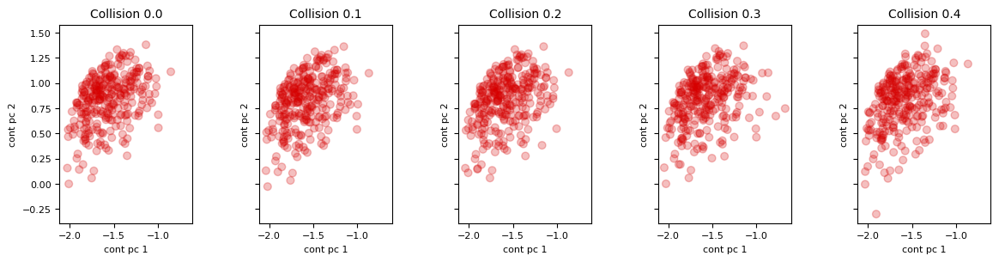

In [28]:
labels = labels_test
labels_plot = [0]
alpha = .25
indices = np.where(np.in1d(labels, labels_plot))[0]
fig, axes = plt.subplots(1,len(aug_wfs_list),figsize=(14,3), sharex=True, sharey=True)

for i, cont_reps_test_aug in enumerate(cont_reps_test_aug_list):
    #compute pcs for cont
    pcs_test_cont_aug, _  = pca_train(cont_reps_test_aug, cont_reps_test_aug, n_comps=2)
    axes[i].scatter(pcs_test_cont_aug[indices, 0], pcs_test_cont_aug[indices, 1], c=[ccolors[i] for i in labels[indices]], s=40, zorder=2, alpha=alpha)
    axes[i].set_title(f'Collision {crop_prob_list[i]}');
    axes[i].set_xlabel('cont pc 1')
    axes[i].set_ylabel('cont pc 2')
fig.subplots_adjust(wspace=0.5)

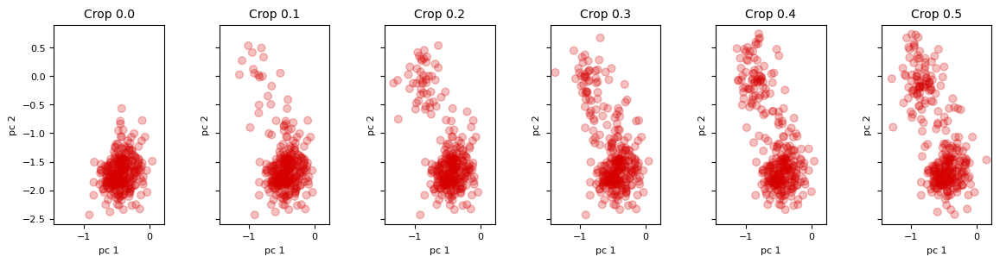

In [71]:
labels = labels_test
labels_plot = [0]
alpha = .25
indices = np.where(np.in1d(labels, labels_plot))[0]
fig, axes = plt.subplots(1,len(aug_wfs_list),figsize=(14,3), sharex=True, sharey=True)

for i, aug_wfs in enumerate(aug_wfs_list):
    #compute pcs for augmented waveforms
    aug_wfs_norm = np.array([wf.flatten() for wf in aug_wfs]) - wfs_train_mean
    aug_pcs_test, _  = pca_train(wfs_train_norm, aug_wfs_norm, n_comps=5)
    # aug_pcs_test_pcs, _  = pca_train(aug_pcs_test, aug_pcs_test, n_comps=2)
    axes[i].scatter(aug_pcs_test[indices, 0], aug_pcs_test[indices, 1], c=[ccolors[i] for i in labels[indices]], s=40, zorder=2, alpha=alpha)
    axes[i].set_title(f'Crop {crop_prob_list[i]}');
    axes[i].set_xlabel('pc 1')
    axes[i].set_ylabel('pc 2')
fig.subplots_adjust(wspace=0.5)

In [27]:
len(aug_wfs_list)

0

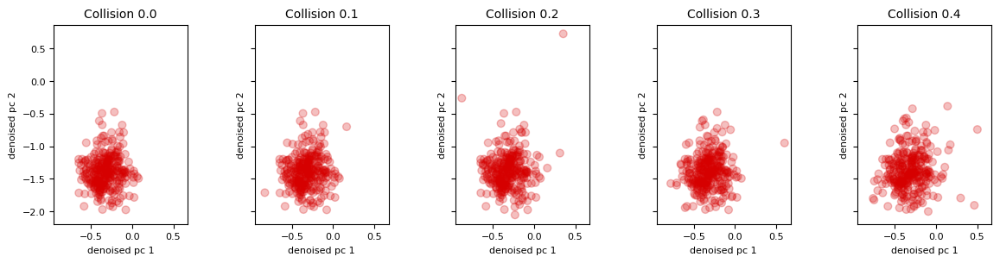

In [51]:
labels = labels_test
labels_plot = [0]
alpha = .25
indices = np.where(np.in1d(labels, labels_plot))[0]
fig, axes = plt.subplots(1,len(aug_wfs_list),figsize=(14,3), sharex=True, sharey=True)

denoiser = SingleChanDenoiser()
denoiser.load('/moto/home/ch3676/spike-psvae/pretrained/single_chan_denoiser.pt')

for i, aug_wfs in enumerate(aug_wfs_list):
    #compute pcs for augmented waveforms
    denoised_aug_wfs = []
    for aug_wf in aug_wfs:
        with torch.no_grad():
            if not is_multi_chan:
                curr_wf = torch.unsqueeze(torch.from_numpy(aug_wf), dim=0)
                den_wf = denoiser(curr_wf)
            else:
                den_wf_ch_list = []
                batch_size = 121
                seq_batches = np.array_split(aug_wf[:,0], len(aug_wf[:,0]) / batch_size)
                for wf_ch in seq_batches:
                    wf_ch = torch.unsqueeze(torch.from_numpy(wf_ch), dim=0)
                    den_wf_ch = denoiser(wf_ch)
                    den_wf_ch_list.append(den_wf_ch)
                den_wf = torch.concatenate(den_wf_ch_list)
            denoised_aug_wfs.append(den_wf.squeeze().numpy())
    denoised_aug_wfs = np.asarray(denoised_aug_wfs)
    # print(denoised_aug_wfs.shape)
    # barf
    
    aug_wfs_norm = np.array([wf.flatten() for wf in denoised_aug_wfs]) - wfs_train_mean
    aug_pcs_test, _  = pca_train(wfs_train_norm, aug_wfs_norm, n_comps=5)
    # aug_pcs_test_pcs, _  = pca_train(aug_pcs_test, aug_pcs_test, n_comps=2)
    axes[i].scatter(aug_pcs_test[indices, 0], aug_pcs_test[indices, 1], c=[ccolors[i] for i in labels[indices]], s=40, zorder=2, alpha=alpha)
    axes[i].set_title(f'Collision {crop_prob_list[i]}');
    axes[i].set_xlabel('denoised pc 1')
    axes[i].set_ylabel('denoised pc 2')
fig.subplots_adjust(wspace=0.5)

In [42]:
batch_size = 121
seq_batches = np.array_split(aug_wf[:,0], len(aug_wf[:,0]) / batch_size)

In [45]:
len(seq_batches)

11

In [41]:
aug_wf[:,0][

(1331,)

In [33]:
denoised_aug_wfs.shape

(3000, 21, 121)

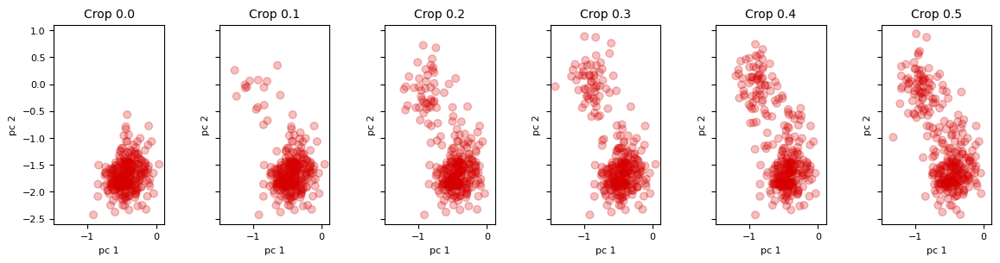

In [30]:
labels = labels_test
labels_plot = [0]
alpha = .25
indices = np.where(np.in1d(labels, labels_plot))[0]
fig, axes = plt.subplots(1,len(aug_wfs_list),figsize=(14,3), sharex=True, sharey=True)

for i, aug_wfs in enumerate(aug_wfs_list):
    #compute pcs for augmented waveforms
    aug_wfs_norm = np.array([wf.flatten() for wf in aug_wfs]) - wfs_train_mean
    aug_pcs_test, _  = pca_train(wfs_train_norm, aug_wfs_norm, n_comps=5)
    # aug_pcs_test_pcs, _  = pca_train(aug_pcs_test, aug_pcs_test, n_comps=2)
    axes[i].scatter(aug_pcs_test[indices, 0], aug_pcs_test[indices, 1], c=[ccolors[i] for i in labels[indices]], s=40, zorder=2, alpha=alpha)
    axes[i].set_title(f'Crop {crop_prob_list[i]}');
    axes[i].set_xlabel('pc 1')
    axes[i].set_ylabel('pc 2')
fig.subplots_adjust(wspace=0.5)

In [ ]:
labels = labels_test
labels_plot = [0]
alpha = .25
indices = np.where(np.in1d(labels, labels_plot))[0]
fig, axes = plt.subplots(1,len(aug_wfs_list),figsize=(14,3), sharex=True, sharey=True)

for i, aug_wfs in enumerate(aug_wfs_list):
    #compute pcs for augmented waveforms
    aug_wfs_norm = np.array([wf.flatten() for wf in aug_wfs]) - wfs_train_mean
    aug_pcs_test, _  = pca_train(wfs_train_norm, aug_wfs_norm, n_comps=5)
    # aug_pcs_test_pcs, _  = pca_train(aug_pcs_test, aug_pcs_test, n_comps=2)
    axes[i].scatter(aug_pcs_test[indices, 0], aug_pcs_test[indices, 1], c=[ccolors[i] for i in labels[indices]], s=40, zorder=2, alpha=alpha)
    axes[i].set_title(f'Crop {crop_prob_list[i]}');
    axes[i].set_xlabel('pc 1')
    axes[i].set_ylabel('pc 2')
fig.subplots_adjust(wspace=0.5)

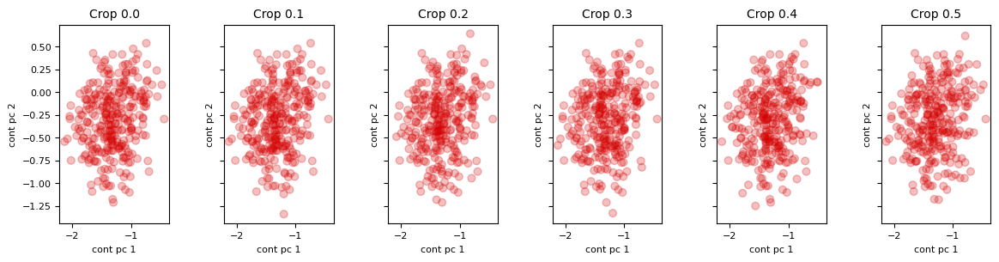

In [70]:
labels = labels_test
labels_plot = [0]
alpha = .25
indices = np.where(np.in1d(labels, labels_plot))[0]
fig, axes = plt.subplots(1,len(aug_wfs_list),figsize=(14,3), sharex=True, sharey=True)

for i, cont_reps_test_aug in enumerate(cont_reps_test_aug_list):
    #compute pcs for cont
    # pcs_test_cont_aug, _  = pca_train(cont_reps_test_aug, cont_reps_test_aug, n_comps=2)
    axes[i].scatter(cont_reps_test_aug[indices, 0], cont_reps_test_aug[indices, 4], c=[ccolors[i] for i in labels[indices]], s=40, zorder=2, alpha=alpha)
    axes[i].set_title(f'Crop {crop_prob_list[i]}');
    axes[i].set_xlabel('cont pc 1')
    axes[i].set_ylabel('cont pc 2')
fig.subplots_adjust(wspace=0.5)

In [66]:
cont_reps_test_aug_list[0][232]

array([-1.1574538, -0.3253338,  0.5530073,  1.449089 , -1.0329497],
      dtype=float32)

In [65]:
cont_reps_test_aug_list[3][232]

array([-1.1574538, -0.3253338,  0.5530073,  1.449089 , -1.0329497],
      dtype=float32)

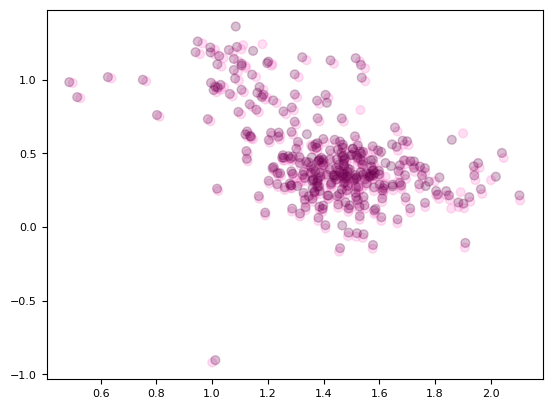

In [61]:
labels = labels_test
labels_plot = [5]
alpha = .25
indices = np.where(np.in1d(labels, labels_plot))[0]
plt.scatter(pcs_test_cont[indices, 0], pcs_test_cont[indices, 1], c=[ccolors[i] for i in labels[indices]], s=40, zorder=2, alpha=alpha)
plt.scatter(pcs_test_cont_aug[indices, 0], pcs_test_cont_aug[indices, 1], c=[ccolors[i+1] for i in labels[indices]], s=40, zorder=2, alpha=alpha)

In [174]:
np.array_equal(cont_reps_test, cont_reps_test_aug)

False

In [173]:
cont_reps_test_aug

array([[-1.4063151 , -0.18351603,  0.6616857 ,  1.3192433 , -0.30805477],
       [-1.3467432 , -0.33851147,  0.5862572 ,  1.1967212 ,  0.19740885],
       [-1.8273017 , -0.2436366 ,  0.661512  ,  1.065934  , -0.25450274],
       ...,
       [-0.1065239 , -0.9152075 ,  0.63327485, -0.17979184, -0.4779739 ],
       [ 0.34338266, -1.1868529 ,  0.28988722,  0.36461672, -0.23747174],
       [-0.08988048, -1.3297894 ,  0.69966173,  0.05411204, -0.16808952]],
      dtype=float32)

In [ ]:
#visualize aug representations in 2D pca
# pcs_train_cont_aug, _, _ = pca(cont_reps_test_aug, n_comps=2)
pcs_test_cont, _  = pca_train(cont_reps_test, cont_reps_test, n_comps=2)
pcs_test_cont_aug, _  = pca_train(cont_reps_test_aug, cont_reps_test_aug, n_comps=2)

In [93]:
pcs_test_cont

array([[-1.617429  ,  0.8637243 ],
       [-1.3700438 ,  0.67904794],
       [-1.8201381 ,  0.4894171 ],
       ...,
       [-0.3517602 ,  0.02409226],
       [-0.21697262,  0.30891162],
       [-0.4319113 ,  0.15168172]], dtype=float32)

In [92]:
pcs_test_cont_aug

array([[-1.6242884 ,  0.84226686],
       [-1.3762031 ,  0.6586154 ],
       [-1.8553021 ,  0.42546344],
       ...,
       [-0.350335  ,  0.01848209],
       [-0.22080806,  0.30316064],
       [-0.4324693 ,  0.14312093]], dtype=float32)

In [ ]:
labels_plot = [7, 5] #labels to plot
labels = labels_train #all labels
X_plot = pcs_train_cont #plot these reps
plot_feature = 'cont pc'
X_dist = cont_reps_train #compute dist on these reps
wfs_plot = wfs_train #plot these waveforms 
close_to = 1 #closest points to index 1 label
num_spikes = 4 #num spikes to plot

plot_closest_spikes(X_plot, X_dist, wfs_plot, labels, labels_plot, plot_feature, annotate_offset = .05, close_to=close_to, num_spikes=num_spikes)

In [ ]:
#visualize aug representations in 2D pca
pcs_train_cont, _, _ = pca(cont_reps_train, n_comps=2)
pcs_test_cont, _  = pca_train(cont_reps_train, cont_reps_test, n_comps=2)


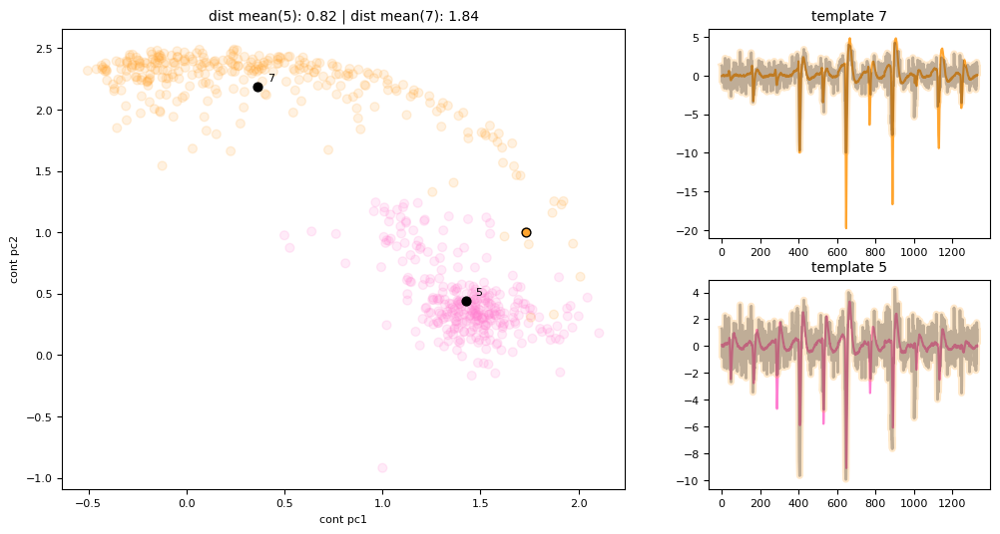

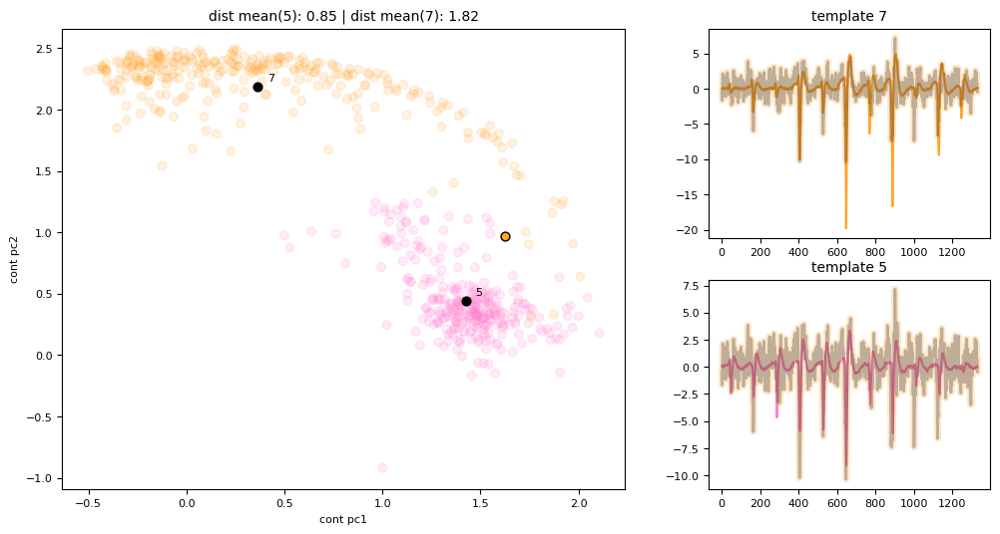

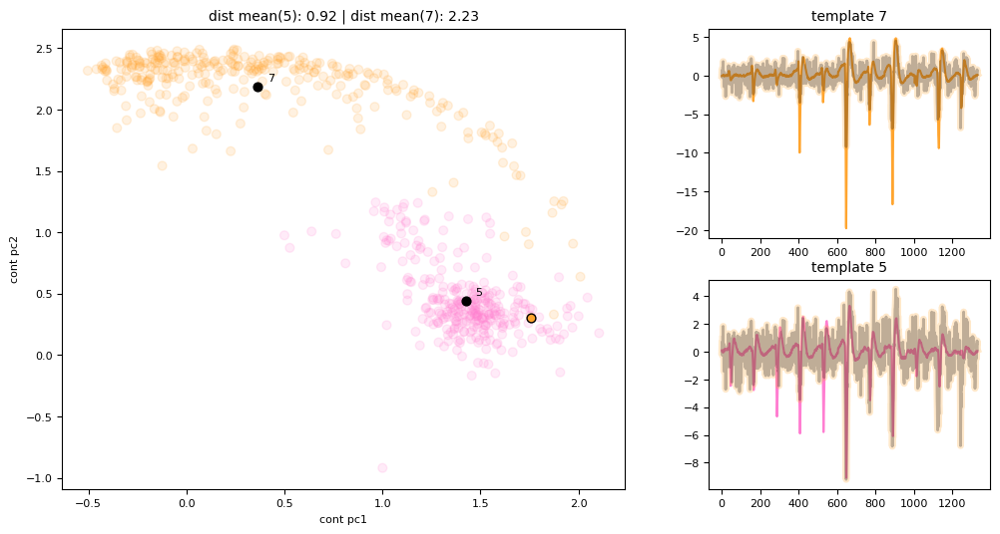

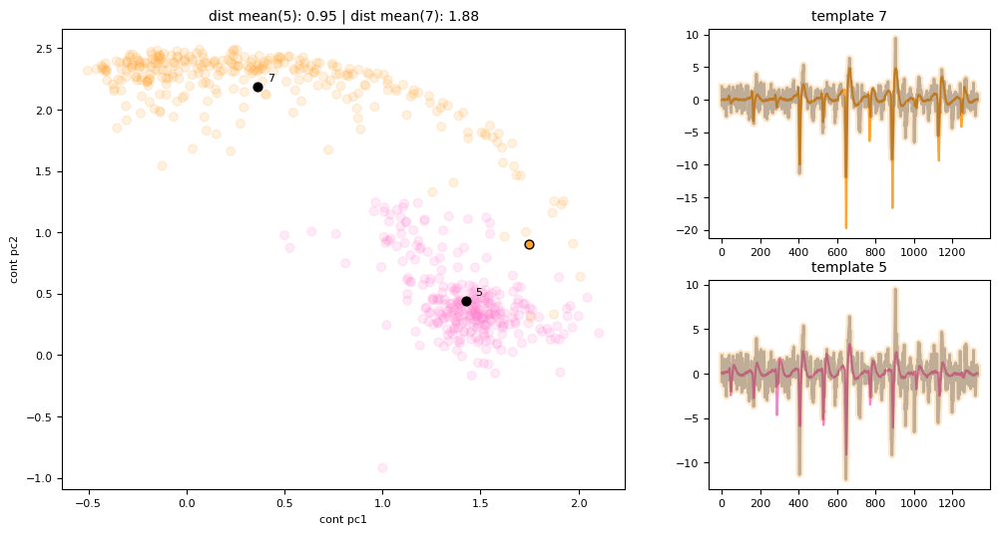

In [90]:
labels_plot = [7, 5] #labels to plot
labels = labels_test #all labels
X_plot = pcs_test_cont #plot these reps
plot_feature = 'cont pc'
X_dist = cont_reps_test #compute dist on these reps
wfs_plot = wfs_test #plot these waveforms 
close_to = 1 #closest points to index 1 label
num_spikes = 4 #num spikes to plot
alpha = .15

plot_closest_spikes(X_plot, X_dist, wfs_plot, labels, labels_plot, plot_feature, annotate_offset = .05, close_to=close_to, num_spikes=num_spikes, alpha=alpha)

# X_plot = denoised_pcs_train_pcs #plot these reps
# plot_feature = 'denoised pc'
# plot_closest_spikes(X_plot, X_dist, wfs_plot, labels, labels_plot, plot_feature, annotate_offset = .05, close_to=close_to, num_spikes=num_spikes)

In [1]:
labels_plot = [7, 5] #labels to plot
labels = labels_test #all labels
X_plot = pcs_test_cont #plot these reps
plot_feature = 'cont pc'
X_dist = cont_reps_test #compute dist on these reps
wfs_plot = wfs_test #plot these waveforms 
close_to = 0 #closest points to index 1 label
num_spikes = 4 #num spikes to plot
alpha = .15

plot_closest_spikes(X_plot, X_dist, wfs_plot, labels, labels_plot, plot_feature, annotate_offset = .05, close_to=close_to, num_spikes=num_spikes, alpha=alpha)

# X_plot = denoised_pcs_train_pcs #plot these reps
# plot_feature = 'denoised pc'
# plot_closest_spikes(X_plot, X_dist, wfs_plot, labels, labels_plot, plot_feature, annotate_offset = .05, close_to=close_to, num_spikes=num_spikes)

NameError: name 'labels_test' is not defined

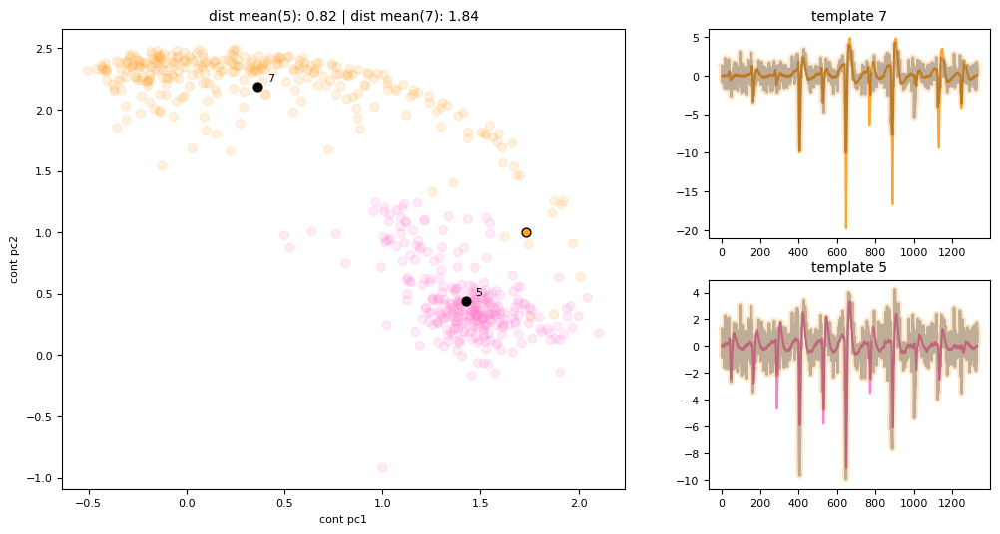

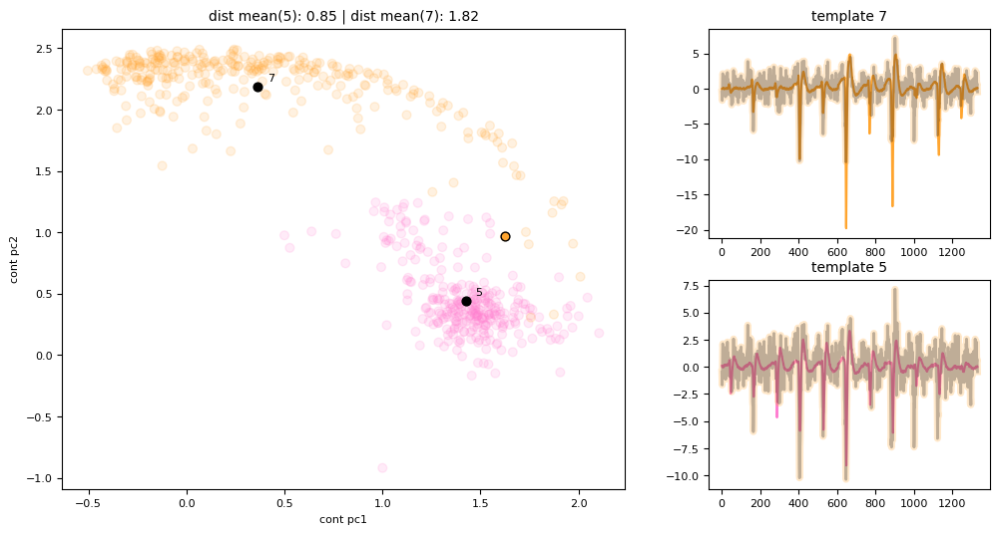

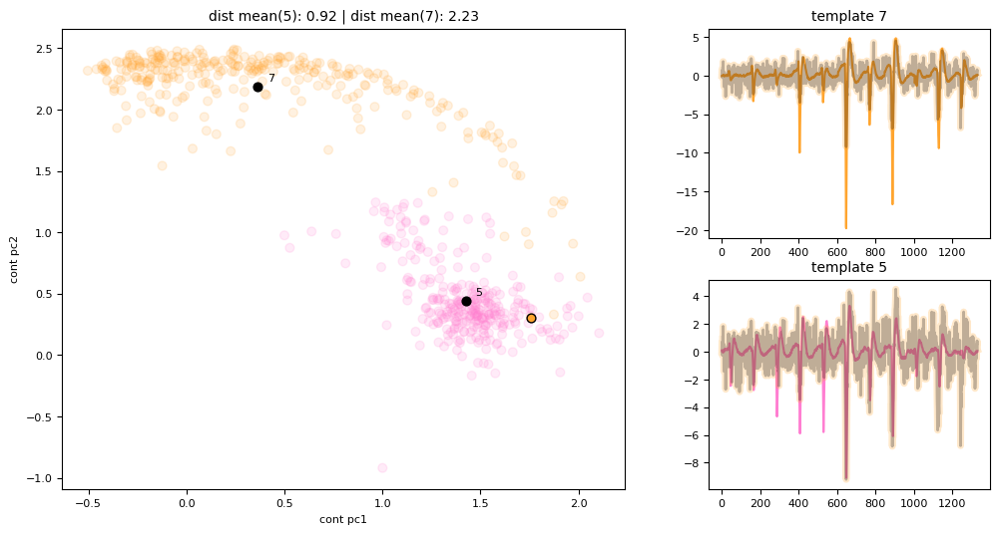

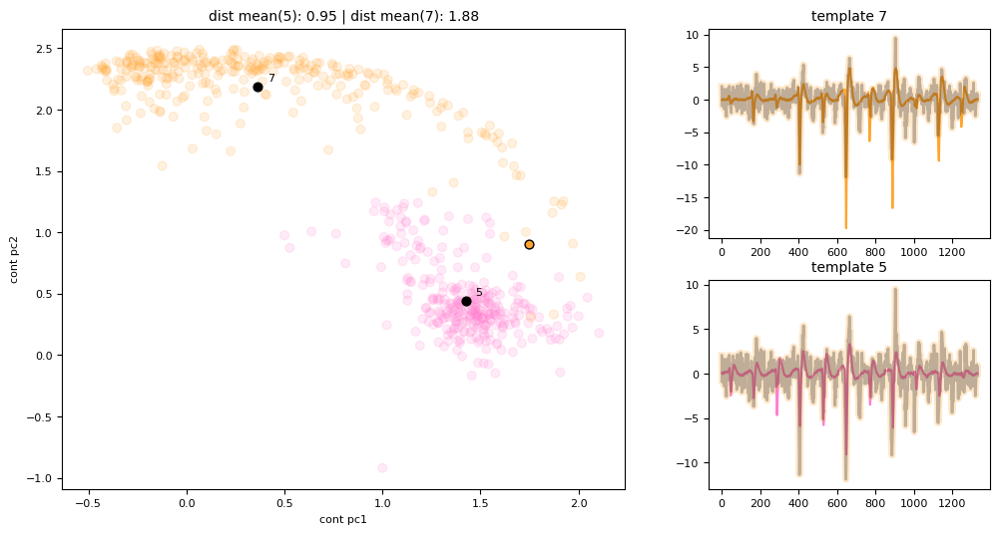

In [82]:
labels_plot = [7, 5] #labels to plot
labels = labels_test #all labels
X_plot = pcs_test_cont #plot these reps
plot_feature = 'cont pc'
X_dist = cont_reps_test #compute dist on these reps
wfs_plot = wfs_test #plot these waveforms 
close_to = 1 #closest points to index 1 label
num_spikes = 4 #num spikes to plot
alpha = .15

plot_closest_spikes(X_plot, X_dist, wfs_plot, labels, labels_plot, plot_feature, annotate_offset = .05, close_to=close_to, num_spikes=num_spikes, alpha=alpha)

# X_plot = denoised_pcs_train_pcs #plot these reps
# plot_feature = 'denoised pc'
# plot_closest_spikes(X_plot, X_dist, wfs_plot, labels, labels_plot, plot_feature, annotate_offset = .05, close_to=close_to, num_spikes=num_spikes)

In [68]:
# labels_plot = [7, 5] #labels to plot
# labels = labels_train #all labels
# X_plot = pcs_train_cont #plot these reps
# plot_feature = 'cont pc'
# X_dist = cont_reps_train #compute dist on these reps
# wfs_plot = wfs_train #plot these waveforms 
# close_to = 1 #closest points to index 1 label
# num_spikes = 4 #num spikes to plot

# plot_closest_spikes(X_plot, X_dist, wfs_plot, labels, labels_plot, plot_feature, annotate_offset = .05, close_to=close_to, num_spikes=num_spikes)

# X_plot = denoised_pcs_train_pcs #plot these reps
# plot_feature = 'denoised pc'
# plot_closest_spikes(X_plot, X_dist, wfs_plot, labels, labels_plot, plot_feature, annotate_offset = .05, close_to=close_to, num_spikes=num_spikes)

In [66]:
# labels_plot = [7, 5] #labels to plot
# labels = labels_train #all labels
# X_plot = pcs_train_cont #plot these reps
# plot_feature = 'cont pc'
# X_dist = cont_reps_train #compute dist on these reps
# wfs_plot = wfs_train #plot these waveforms 
# close_to = 0 #closest points to index 1 label
# num_spikes = 4 #num spikes to plot

# plot_closest_spikes(X_plot, X_dist, wfs_plot, labels, labels_plot, plot_feature, annotate_offset = .05, close_to=close_to, num_spikes=num_spikes)

# X_plot = denoised_pcs_train_pcs #plot these reps
# plot_feature = 'denoised pc'
# plot_closest_spikes(X_plot, X_dist, wfs_plot, labels, labels_plot, plot_feature, annotate_offset = .05, close_to=close_to, num_spikes=num_spikes)

In [65]:
# labels_plot = [5, 7] #labels to plot
# labels = labels_train #all labels
# X_plot = pcs_train_cont #plot these reps
# plot_feature = 'cont pc'
# X_dist = denoised_pcs_train_pcs #compute dist on these reps
# wfs_plot = wfs_train #plot these waveforms 
# close_to = 1 #closest points to index 1 label
# num_spikes = 4 #num spikes to plot

# plot_closest_spikes(X_plot, X_dist, wfs_plot, labels, labels_plot, plot_feature, annotate_offset = .05, close_to=close_to, num_spikes=num_spikes)

# X_plot = denoised_pcs_train_pcs #plot these reps
# plot_feature = 'denoised pc'
# plot_closest_spikes(X_plot, X_dist, wfs_plot, labels, labels_plot, plot_feature, annotate_offset = .05, close_to=close_to, num_spikes=num_spikes)

In [67]:
# labels_plot = [2, 0] #labels to plot
# labels = labels_train #all labels
# X_plot = pcs_train_cont #plot these reps
# plot_feature = 'cont pc'
# X_dist = denoised_pcs_train_pcs #compute dist on these reps
# wfs_plot = wfs_train #plot these waveforms 
# close_to = 1 #closest points to index 1 label
# num_spikes = 4 #num spikes to plot

# plot_closest_spikes(X_plot, X_dist, wfs_plot, labels, labels_plot, plot_feature, annotate_offset = .05, close_to=close_to, num_spikes=num_spikes)

# X_plot = denoised_pcs_train_pcs #plot these reps
# plot_feature = 'denoised pc'
# plot_closest_spikes(X_plot, X_dist, wfs_plot, labels, labels_plot, plot_feature, annotate_offset = .05, close_to=close_to, num_spikes=num_spikes)

In [ ]:
# cont_reps_train = []
# with torch.no_grad():
#     for data, target in tqdm(train_loader):
#         if not is_multi_chan:
#             data = torch.squeeze(data, dim=1)
#             data = torch.unsqueeze(data, dim=-1)
#         else:
#             data = data.view(-1, 11*121)
#             data = torch.unsqueeze(data, dim=-1)
#         feature = model(data)
#         cont_reps_train.append(feature)
# cont_reps_train = torch.concatenate(cont_reps_train).numpy()

# cont_reps_test = []
# with torch.no_grad():
#     for data, target in tqdm(test_loader):
#         if not is_multi_chan:
#             data = torch.squeeze(data, dim=1)
#             data = torch.unsqueeze(data, dim=-1)
#         else:
#             data = data.view(-1, 11*121)
#             data = torch.unsqueeze(data, dim=-1)
#         feature = model(data)
#         cont_reps_test.append(feature)
# cont_reps_test = torch.concatenate(cont_reps_test).numpy()

In [75]:
X = pcs_test_cont
labels_pred = gmm_cont_test_labels
annotate_offset = .1
fig, axes = plt.subplots(1,2,figsize=(10,4))
axes[0].scatter(X[:, 0], X[:, 1], c=labels_test, s=40, cmap='gist_rainbow', zorder=2, alpha=.1)
for label_plot in range(len(np.unique(labels_test))):
    mean_location = np.mean(X[np.where(labels_test==label_plot)],0)
    axes[0].scatter(mean_location[0], mean_location[1],color='black', alpha=1, s=40, zorder=2)
    axes[0].annotate(f'{label_plot}', (mean_location[0]+annotate_offset, mean_location[1]+annotate_offset))
axes[0].set_title('Raw 5D contrastive (2 pcs), true labels')
axes[0].set_xlabel('cont pc1')
axes[0].set_ylabel('cont pc2');
axes[1].scatter(X[:, 0], X[:, 1], c=labels_pred, s=40, cmap='gist_rainbow', zorder=2, alpha=.1)
for label_plot in range(len(np.unique(labels_pred))):
    mean_location = np.mean(X[np.where(labels_pred==label_plot)],0)
    axes[1].scatter(mean_location[0], mean_location[1],color='black', alpha=1, s=40, zorder=2)
    axes[1].annotate(f'{label_plot}', (mean_location[0]+annotate_offset, mean_location[1]+annotate_offset))
score = adjusted_rand_score(labels_test, labels_pred)*100
axes[1].set_title(f'10 GMM, rand_score: {np.round(score,decimals=2)}');
axes[1].set_xlabel('cont pc1')
axes[1].set_ylabel('cont pc2');

NameError: name 'pcs_test_cont' is not defined

In [289]:
a[min_indices[0]]

array([ 0.785606  ,  0.87003624, -0.73591214, -0.17068094,  1.2471536 ],
      dtype=float32)

In [290]:
distance = cdist(a[min_indices[0]][None,:], np.mean(a,0)[None,:], 'euclidean')

In [292]:
distance

array([[1.69139842]])

In [285]:
min_indices = np.argsort(np.min(distance, axis=1))[:1]
min_dist = np.sort(np.min(distance, axis=1))[:1]

In [280]:
np.mean(b,0)[:,None]

array([[-0.0834136 ],
       [ 1.2213707 ],
       [-0.58564985],
       [-0.20188305],
       [ 0.81578714]], dtype=float32)

In [277]:
np.mean(b,0)

array([-0.0834136 ,  1.2213707 , -0.58564985, -0.20188305,  0.81578714],
      dtype=float32)

In [271]:
min_indices

array([596])

Text(0, 0.5, 'raw pc2')

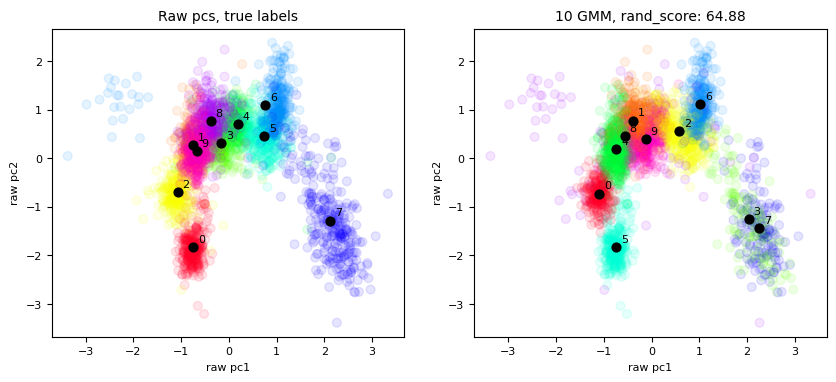

In [141]:
X = pcs_test
labels_pred = pc_test_labels
annotate_offset = .1
fig, axes = plt.subplots(1,2,figsize=(10,4))
axes[0].scatter(X[:, 0], X[:, 1], c=labels_test, s=40, cmap='gist_rainbow', zorder=2, alpha=.1)
for label_plot in range(len(np.unique(labels_test))):
    mean_location = np.mean(X[np.where(labels_test==label_plot)],0)
    axes[0].scatter(mean_location[0], mean_location[1],color='black', alpha=1, s=40, zorder=2)
    axes[0].annotate(f'{label_plot}', (mean_location[0]+annotate_offset, mean_location[1]+annotate_offset))
axes[0].set_title('Raw pcs, true labels')
axes[0].set_xlabel('raw pc1')
axes[0].set_ylabel('raw pc2')
axes[1].scatter(X[:, 0], X[:, 1], c=labels_pred, s=40, cmap='gist_rainbow', zorder=2, alpha=.1)
for label_plot in range(len(np.unique(labels_pred))):
    mean_location = np.mean(X[np.where(labels_pred==label_plot)],0)
    axes[1].scatter(mean_location[0], mean_location[1],color='black', alpha=1, s=40, zorder=2)
    axes[1].annotate(f'{label_plot}', (mean_location[0]+annotate_offset, mean_location[1]+annotate_offset))
score = adjusted_rand_score(labels_test, labels_pred)*100
axes[1].set_title(f'10 GMM, rand_score: {np.round(score,decimals=2)}');
axes[1].set_xlabel('raw pc1')
axes[1].set_ylabel('raw pc2')

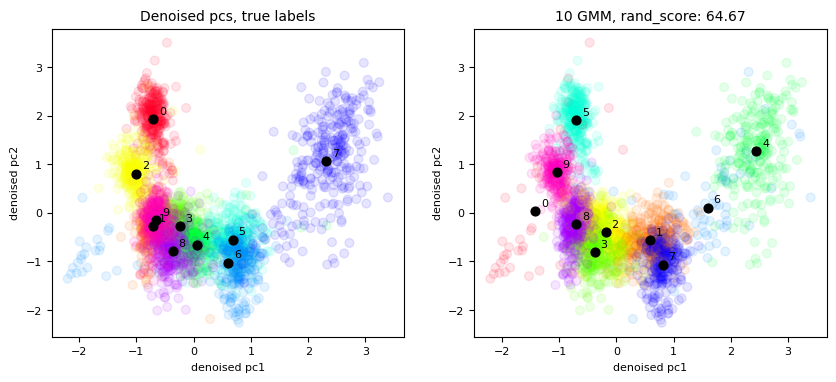

In [142]:
X = denoised_pcs_test
labels_pred = denoised_pc_test_labels
annotate_offset = .1
fig, axes = plt.subplots(1,2,figsize=(10,4))
axes[0].scatter(X[:, 0], X[:, 1], c=labels_test, s=40, cmap='gist_rainbow', zorder=2, alpha=.1)
for label_plot in range(len(np.unique(labels_test))):
    mean_location = np.mean(X[np.where(labels_test==label_plot)],0)
    axes[0].scatter(mean_location[0], mean_location[1],color='black', alpha=1, s=40, zorder=2)
    axes[0].annotate(f'{label_plot}', (mean_location[0]+annotate_offset, mean_location[1]+annotate_offset))
axes[0].set_title('Denoised pcs, true labels')
axes[0].set_xlabel('denoised pc1')
axes[0].set_ylabel('denoised pc2')
axes[1].scatter(X[:, 0], X[:, 1], c=labels_pred, s=40, cmap='gist_rainbow', zorder=2, alpha=.1)
for label_plot in range(len(np.unique(labels_pred))):
    mean_location = np.mean(X[np.where(labels_pred==label_plot)],0)
    axes[1].scatter(mean_location[0], mean_location[1],color='black', alpha=1, s=40, zorder=2)
    axes[1].annotate(f'{label_plot}', (mean_location[0]+annotate_offset, mean_location[1]+annotate_offset))
score = adjusted_rand_score(labels_test, labels_pred)*100
axes[1].set_title(f'10 GMM, rand_score: {np.round(score,decimals=2)}')
axes[1].set_xlabel('denoised pc1')
axes[1].set_ylabel('denoised pc2');

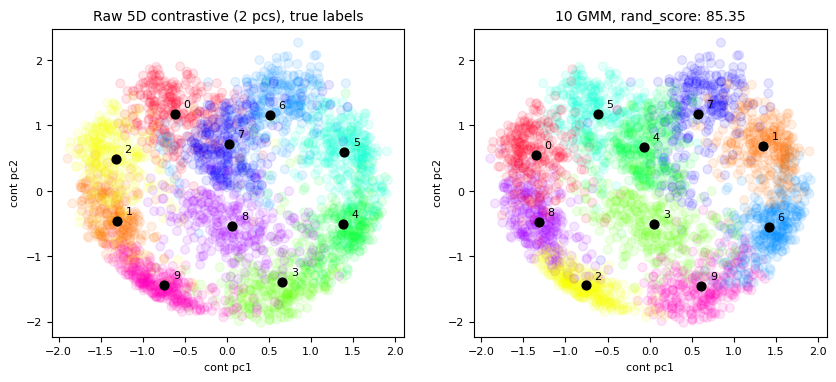

In [88]:
X = pcs_test_cont
labels_pred = gmm_cont_test_labels
annotate_offset = .1
fig, axes = plt.subplots(1,2,figsize=(10,4))
axes[0].scatter(X[:, 0], X[:, 1], c=labels_test, s=40, cmap='gist_rainbow', zorder=2, alpha=.1)
for label_plot in range(len(np.unique(labels_test))):
    mean_location = np.mean(X[np.where(labels_test==label_plot)],0)
    axes[0].scatter(mean_location[0], mean_location[1],color='black', alpha=1, s=40, zorder=2)
    axes[0].annotate(f'{label_plot}', (mean_location[0]+annotate_offset, mean_location[1]+annotate_offset))
axes[0].set_title('Raw 5D contrastive (2 pcs), true labels')
axes[0].set_xlabel('cont pc1')
axes[0].set_ylabel('cont pc2');
axes[1].scatter(X[:, 0], X[:, 1], c=labels_pred, s=40, cmap='gist_rainbow', zorder=2, alpha=.1)
for label_plot in range(len(np.unique(labels_pred))):
    mean_location = np.mean(X[np.where(labels_pred==label_plot)],0)
    axes[1].scatter(mean_location[0], mean_location[1],color='black', alpha=1, s=40, zorder=2)
    axes[1].annotate(f'{label_plot}', (mean_location[0]+annotate_offset, mean_location[1]+annotate_offset))
score = adjusted_rand_score(labels_test, labels_pred)*100
axes[1].set_title(f'10 GMM, rand_score: {np.round(score,decimals=2)}');
axes[1].set_xlabel('cont pc1')
axes[1].set_ylabel('cont pc2');

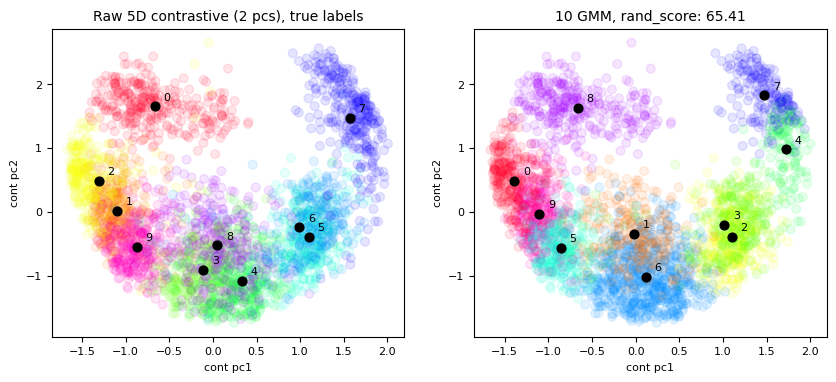

In [144]:
X = pcs_test_cont
labels_pred = gmm_cont_test_labels
annotate_offset = .1
fig, axes = plt.subplots(1,2,figsize=(10,4))
axes[0].scatter(X[:, 0], X[:, 1], c=labels_test, s=40, cmap='gist_rainbow', zorder=2, alpha=.1)
for label_plot in range(len(np.unique(labels_test))):
    mean_location = np.mean(X[np.where(labels_test==label_plot)],0)
    axes[0].scatter(mean_location[0], mean_location[1],color='black', alpha=1, s=40, zorder=2)
    axes[0].annotate(f'{label_plot}', (mean_location[0]+annotate_offset, mean_location[1]+annotate_offset))
axes[0].set_title('Raw 5D contrastive (2 pcs), true labels')
axes[0].set_xlabel('cont pc1')
axes[0].set_ylabel('cont pc2');
axes[1].scatter(X[:, 0], X[:, 1], c=labels_pred, s=40, cmap='gist_rainbow', zorder=2, alpha=.1)
for label_plot in range(len(np.unique(labels_pred))):
    mean_location = np.mean(X[np.where(labels_pred==label_plot)],0)
    axes[1].scatter(mean_location[0], mean_location[1],color='black', alpha=1, s=40, zorder=2)
    axes[1].annotate(f'{label_plot}', (mean_location[0]+annotate_offset, mean_location[1]+annotate_offset))
score = adjusted_rand_score(labels_test, labels_pred)*100
axes[1].set_title(f'10 GMM, rand_score: {np.round(score,decimals=2)}');
axes[1].set_xlabel('cont pc1')
axes[1].set_ylabel('cont pc2');

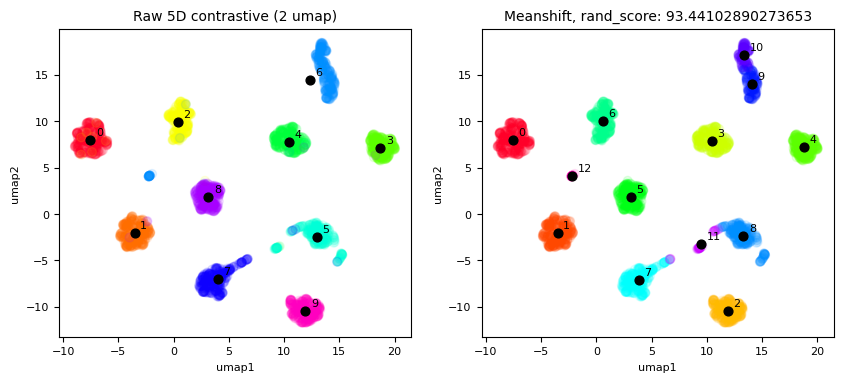

In [268]:
X = cont_test_umap
labels_pred = labels_test_ms
annotate_offset = .5
fig, axes = plt.subplots(1,2,figsize=(10,4))
axes[0].scatter(X[:, 0], X[:, 1], c=labels_test, s=40, cmap='gist_rainbow', zorder=2, alpha=.1)
for label_plot in range(len(np.unique(labels_test))):
    mean_location = np.mean(X[np.where(labels_test==label_plot)],0)
    axes[0].scatter(mean_location[0], mean_location[1],color='black', alpha=1, s=40, zorder=2)
    axes[0].annotate(f'{label_plot}', (mean_location[0]+annotate_offset, mean_location[1]+annotate_offset))
axes[0].set_title('Raw 5D contrastive (2 umap)')
axes[0].set_xlabel('umap1')
axes[0].set_ylabel('umap2');
axes[1].scatter(X[:, 0], X[:, 1], c=labels_pred, s=40, cmap='gist_rainbow', zorder=2, alpha=.1)
for label_plot in range(len(np.unique(labels_pred))):
    mean_location = np.mean(X[np.where(labels_pred==label_plot)],0)
    axes[1].scatter(mean_location[0], mean_location[1],color='black', alpha=1, s=40, zorder=2)
    axes[1].annotate(f'{label_plot}', (mean_location[0]+annotate_offset, mean_location[1]+annotate_offset))
score = adjusted_rand_score(labels_test, labels_pred)*100
axes[1].set_title(f'Meanshift, rand_score: {score}');
axes[1].set_xlabel('umap1')
axes[1].set_ylabel('umap2');

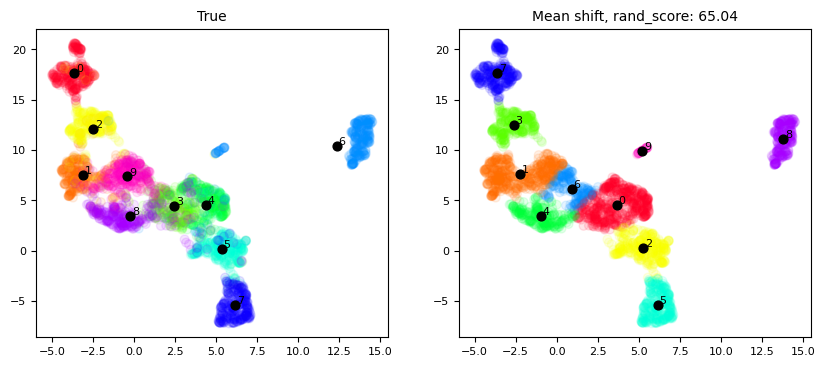

In [146]:
X = cont_test_umap
labels_pred = labels_test_ms
annotate_offset = .1
fig, axes = plt.subplots(1,2,figsize=(10,4))
axes[0].scatter(X[:, 0], X[:, 1], c=labels_test, s=40, cmap='gist_rainbow', zorder=2, alpha=.1)
for label_plot in range(len(np.unique(labels_test))):
    mean_location = np.mean(X[np.where(labels_test==label_plot)],0)
    axes[0].scatter(mean_location[0], mean_location[1],color='black', alpha=1, s=40, zorder=2)
    axes[0].annotate(f'{label_plot}', (mean_location[0]+annotate_offset, mean_location[1]+annotate_offset))
axes[0].set_title('True')
axes[1].scatter(X[:, 0], X[:, 1], c=labels_pred, s=40, cmap='gist_rainbow', zorder=2, alpha=.1)
for label_plot in range(len(np.unique(labels_pred))):
    mean_location = np.mean(X[np.where(labels_pred==label_plot)],0)
    axes[1].scatter(mean_location[0], mean_location[1],color='black', alpha=1, s=40, zorder=2)
    axes[1].annotate(f'{label_plot}', (mean_location[0]+annotate_offset, mean_location[1]+annotate_offset))
score = adjusted_rand_score(labels_test, labels_pred)*100
axes[1].set_title(f'Mean shift, rand_score: {np.round(score,decimals=2)}');

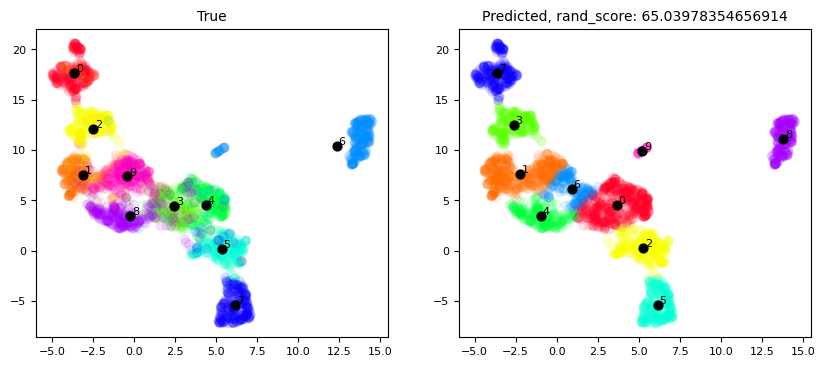

In [147]:
X = cont_test_umap
labels_pred = labels_test_ms
annotate_offset = .1
fig, axes = plt.subplots(1,2,figsize=(10,4))
axes[0].scatter(X[:, 0], X[:, 1], c=labels_test, s=40, cmap='gist_rainbow', zorder=2, alpha=.1)
for label_plot in range(len(np.unique(labels_test))):
    mean_location = np.mean(X[np.where(labels_test==label_plot)],0)
    axes[0].scatter(mean_location[0], mean_location[1],color='black', alpha=1, s=40, zorder=2)
    axes[0].annotate(f'{label_plot}', (mean_location[0]+annotate_offset, mean_location[1]+annotate_offset))
axes[0].set_title('True')
axes[1].scatter(X[:, 0], X[:, 1], c=labels_pred, s=40, cmap='gist_rainbow', zorder=2, alpha=.1)
for label_plot in range(len(np.unique(labels_pred))):
    mean_location = np.mean(X[np.where(labels_pred==label_plot)],0)
    axes[1].scatter(mean_location[0], mean_location[1],color='black', alpha=1, s=40, zorder=2)
    axes[1].annotate(f'{label_plot}', (mean_location[0]+annotate_offset, mean_location[1]+annotate_offset))
score = adjusted_rand_score(labels_test, labels_pred)*100
axes[1].set_title(f'Predicted, rand_score: {score}');

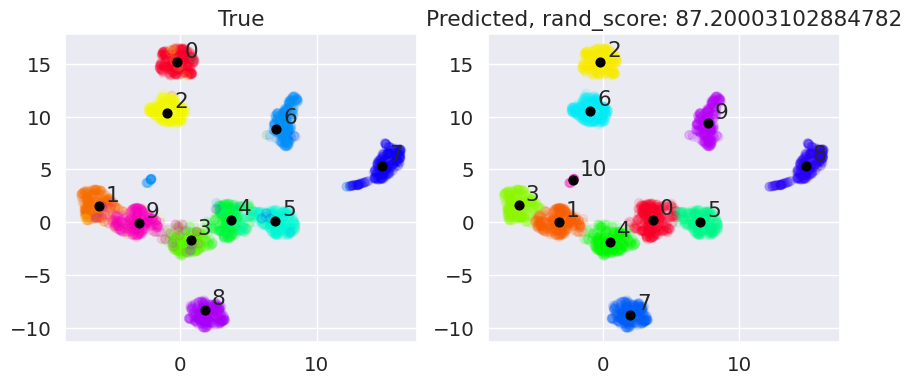

In [56]:
X = cont_test_umap
labels_pred = labels_test_ms
annotate_offset = .5
fig, axes = plt.subplots(1,2,figsize=(10,4))
axes[0].scatter(X[:, 0], X[:, 1], c=labels_test, s=40, cmap='gist_rainbow', zorder=2, alpha=.1)
for label_plot in range(len(np.unique(labels_test))):
    mean_location = np.mean(X[np.where(labels_test==label_plot)],0)
    axes[0].scatter(mean_location[0], mean_location[1],color='black', alpha=1, s=40, zorder=2)
    axes[0].annotate(f'{label_plot}', (mean_location[0]+annotate_offset, mean_location[1]+annotate_offset))
axes[0].set_title('True')
axes[1].scatter(X[:, 0], X[:, 1], c=labels_pred, s=40, cmap='gist_rainbow', zorder=2, alpha=.1)
for label_plot in range(len(np.unique(labels_pred))):
    mean_location = np.mean(X[np.where(labels_pred==label_plot)],0)
    axes[1].scatter(mean_location[0], mean_location[1],color='black', alpha=1, s=40, zorder=2)
    axes[1].annotate(f'{label_plot}', (mean_location[0]+annotate_offset, mean_location[1]+annotate_offset))
score = adjusted_rand_score(labels_test, labels_pred)*100
axes[1].set_title(f'Predicted, rand_score: {score}');

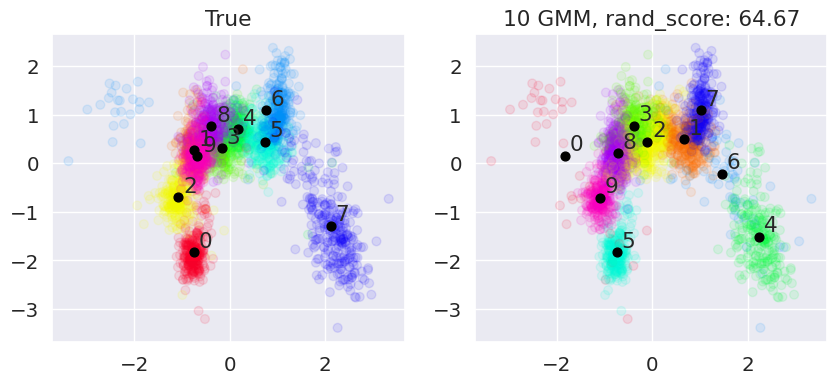

In [90]:
X = pcs_test
labels_pred = pc_test_labels
annotate_offset = .1
fig, axes = plt.subplots(1,2,figsize=(10,4))
axes[0].scatter(X[:, 0], X[:, 1], c=labels_test, s=40, cmap='gist_rainbow', zorder=2, alpha=.1)
for label_plot in range(len(np.unique(labels_test))):
    mean_location = np.mean(X[np.where(labels_test==label_plot)],0)
    axes[0].scatter(mean_location[0], mean_location[1],color='black', alpha=1, s=40, zorder=2)
    axes[0].annotate(f'{label_plot}', (mean_location[0]+annotate_offset, mean_location[1]+annotate_offset))
axes[0].set_title('True')
axes[1].scatter(X[:, 0], X[:, 1], c=labels_pred, s=40, cmap='gist_rainbow', zorder=2, alpha=.1)
for label_plot in range(len(np.unique(labels_pred))):
    mean_location = np.mean(X[np.where(labels_pred==label_plot)],0)
    axes[1].scatter(mean_location[0], mean_location[1],color='black', alpha=1, s=40, zorder=2)
    axes[1].annotate(f'{label_plot}', (mean_location[0]+annotate_offset, mean_location[1]+annotate_offset))
score = adjusted_rand_score(labels_test, labels_pred)*100
axes[1].set_title(f'10 GMM, rand_score: {np.round(score,decimals=2)}');

In [ ]:
X = pcs_test
labels_pred = pc_test_labels
annotate_offset = .1
fig, axes = plt.subplots(1,2,figsize=(10,4))
axes[0].scatter(X[:, 0], X[:, 1], c=labels_test, s=40, cmap='gist_rainbow', zorder=2, alpha=.1)
for label_plot in range(len(np.unique(labels_test))):
    mean_location = np.mean(X[np.where(labels_test==label_plot)],0)
    axes[0].scatter(mean_location[0], mean_location[1],color='black', alpha=1, s=40, zorder=2)
    axes[0].annotate(f'{label_plot}', (mean_location[0]+annotate_offset, mean_location[1]+annotate_offset))
axes[0].set_title('True')
axes[1].scatter(X[:, 0], X[:, 1], c=labels_pred, s=40, cmap='gist_rainbow', zorder=2, alpha=.1)
for label_plot in range(len(np.unique(labels_pred))):
    mean_location = np.mean(X[np.where(labels_pred==label_plot)],0)
    axes[1].scatter(mean_location[0], mean_location[1],color='black', alpha=1, s=40, zorder=2)
    axes[1].annotate(f'{label_plot}', (mean_location[0]+annotate_offset, mean_location[1]+annotate_offset))
score = adjusted_rand_score(labels_test, labels_pred)*100
axes[1].set_title(f'10 GMM, rand_score: {np.round(score,decimals=2)}');

In [ ]:
np.round

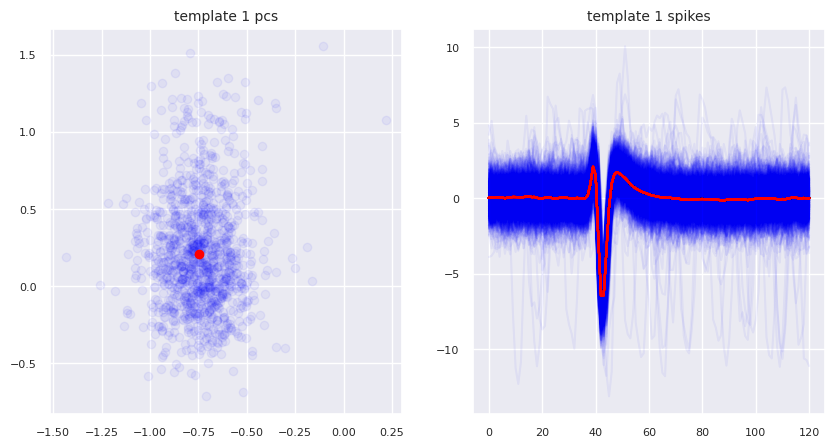

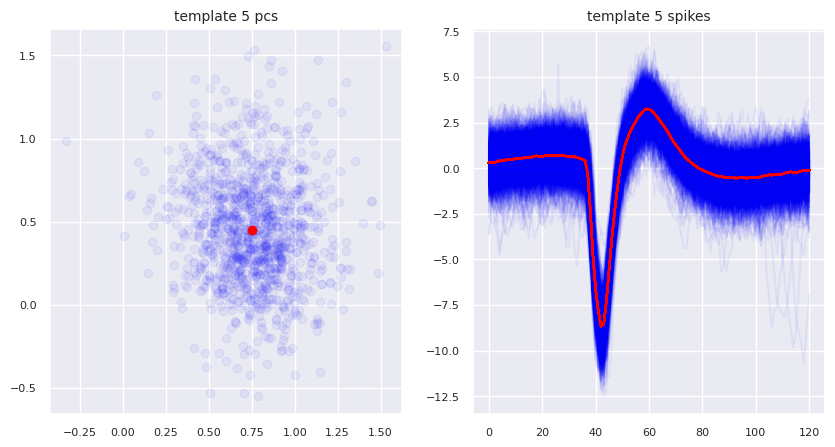

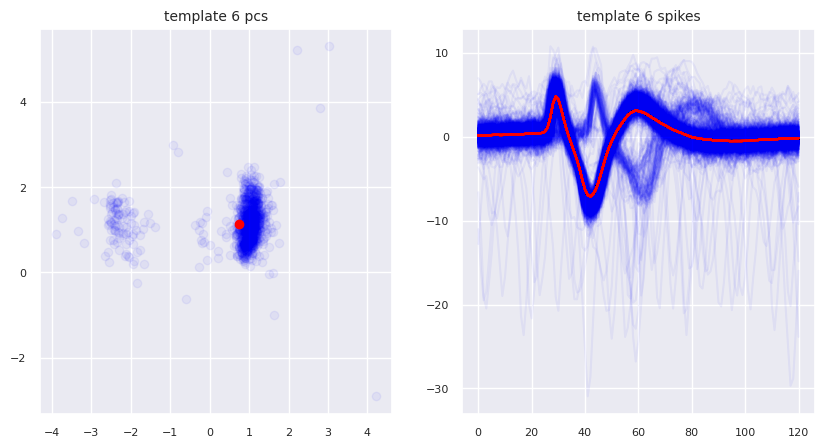

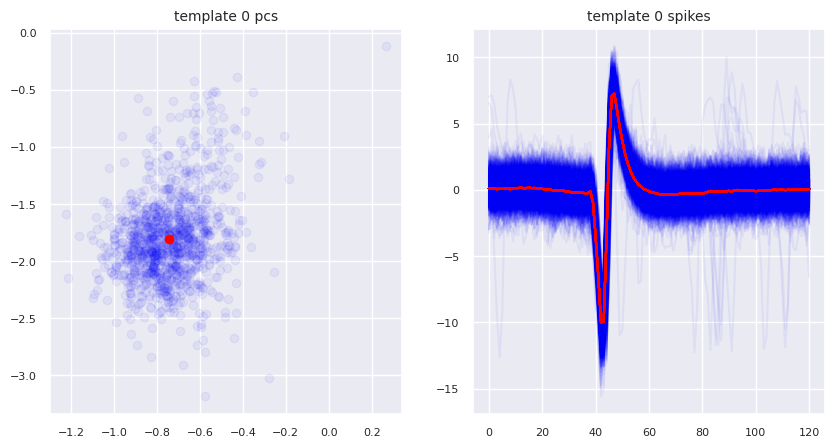

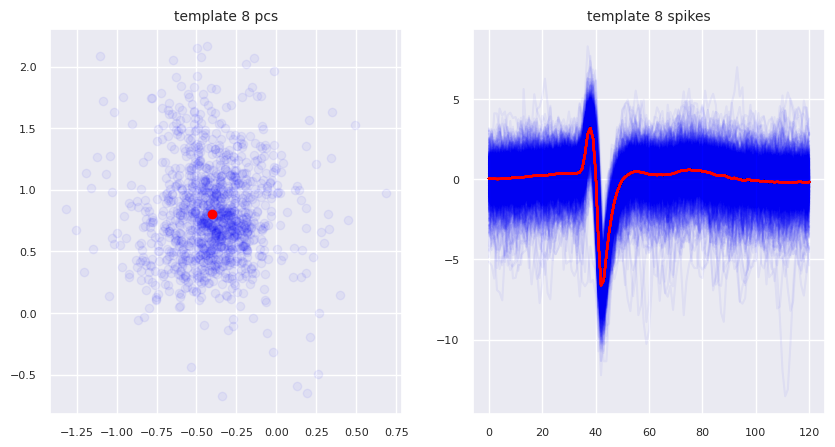

In [159]:
num_plot = 1200
units_plot = [1, 5, 6, 0, 8]
for label_plot in units_plot:#range(len(np.unique(labels_train))):
    fig, axes = plt.subplots(1,2,figsize=(10,5))
    pcs = pcs_train[np.where(labels_train==label_plot)][:num_plot]
    axes[0].scatter(pcs[:,0], pcs[:,1], color='blue', alpha=.05)
    axes[0].scatter(np.mean(pcs,0)[0], np.mean(pcs,0)[1], color='red', alpha=1)
    spikes = wfs_train[np.where(labels_train==label_plot)]
    for spike in spikes[:num_plot]:
        axes[1].plot(spike.flatten(), color='blue', alpha=.05)
        axes[1].plot(np.mean(spikes, 0).flatten(), color='red')
    axes[0].set_title(f'template {label_plot} pcs')
    axes[1].set_title(f'template {label_plot} spikes')
    plt.show()

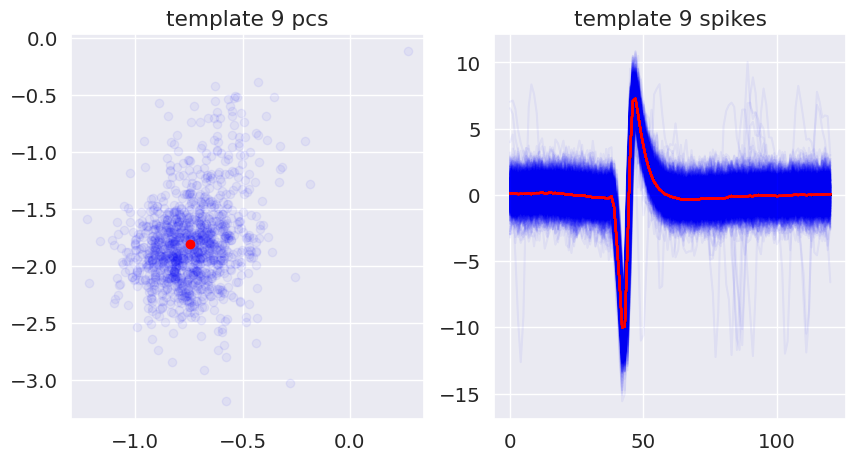

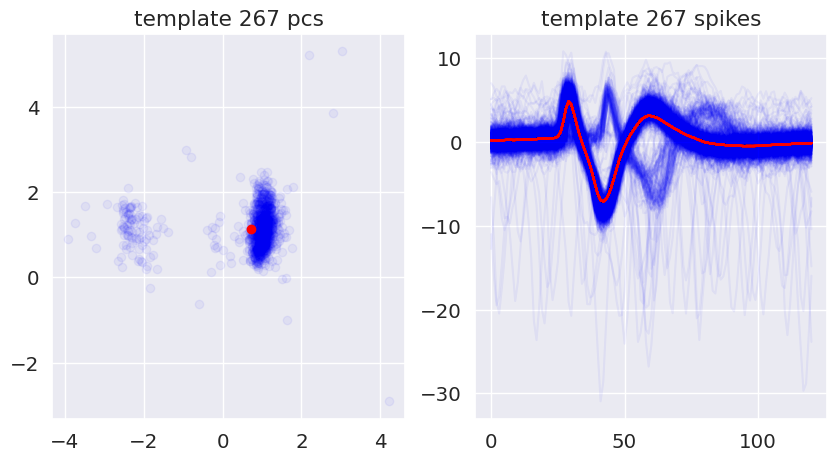

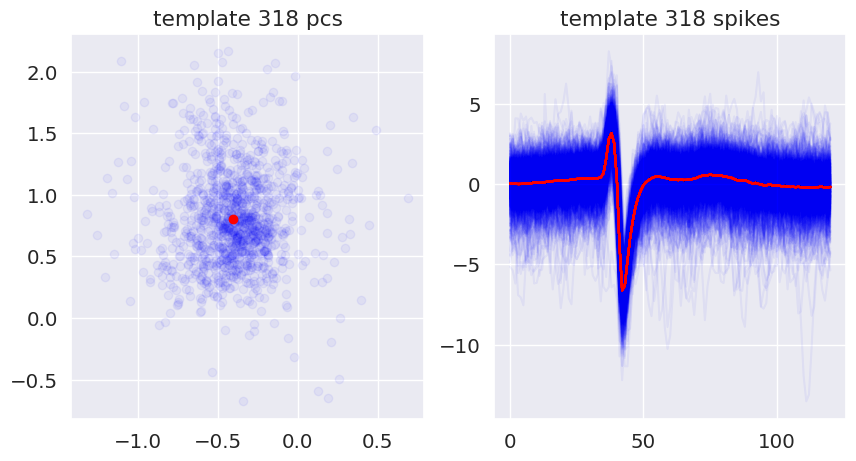

In [58]:
num_plot = 1200
units_plot = [0, 8]
for label_plot in units_plot:#range(len(np.unique(labels_train))):
    fig, axes = plt.subplots(1,2,figsize=(10,5))
    pcs = pcs_train[np.where(labels_train==label_plot)][:num_plot]
    axes[0].scatter(pcs[:,0], pcs[:,1], color='blue', alpha=.05)
    axes[0].scatter(np.mean(pcs,0)[0], np.mean(pcs,0)[1], color='red', alpha=1)
    spikes = wfs_train[np.where(labels_train==label_plot)]
    for spike in spikes[:num_plot]:
        axes[1].plot(spike.flatten(), color='blue', alpha=.05)
        axes[1].plot(np.mean(spikes, 0).flatten(), color='red')
    axes[0].set_title(f'template {label_plot} pcs')
    axes[1].set_title(f'template {label_plot} spikes')
    plt.show()

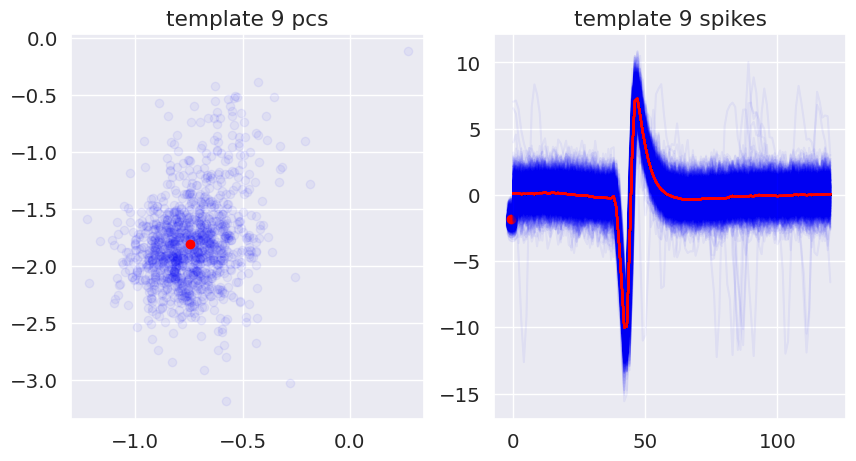

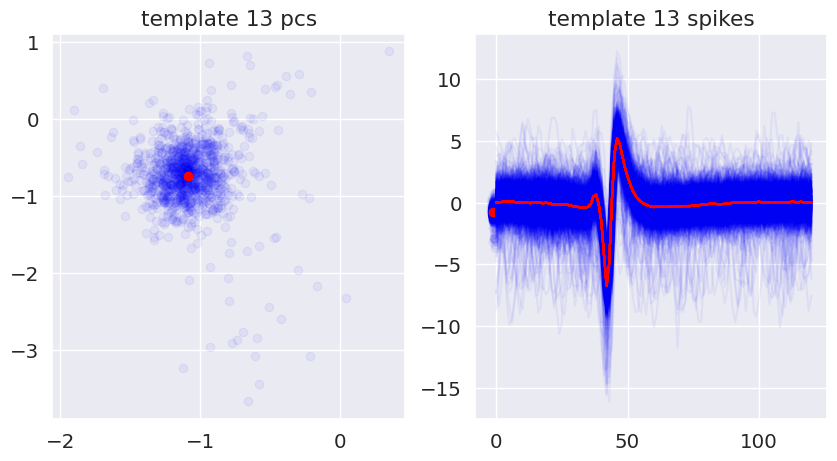

In [43]:
num_plot = 1200
units_plot = [0, 2]
for label_plot in units_plot:#range(len(np.unique(labels_train))):
    fig, axes = plt.subplots(1,2,figsize=(10,5))
    pcs = pcs_train[np.where(labels_train==label_plot)][:num_plot]
    axes[0].scatter(pcs[:,0], pcs[:,1], color='blue', alpha=.05)
    axes[0].scatter(np.mean(pcs,0)[0], np.mean(pcs,0)[1], color='red', alpha=1)
    axes[1].scatter(pcs[:,0], pcs[:,1], color='blue', alpha=.05)
    axes[1].scatter(np.mean(pcs,0)[0], np.mean(pcs,0)[1], color='red', alpha=1)
    spikes = wfs_train[np.where(labels_train==label_plot)]
    for spike in spikes[:num_plot]:
        axes[1].plot(spike.flatten(), color='blue', alpha=.05)
        axes[1].plot(np.mean(spikes, 0).flatten(), color='red')
    axes[0].set_title(f'template {selected_units[label_plot]} pcs')
    axes[1].set_title(f'template {selected_units[label_plot]} spikes')
    plt.show()

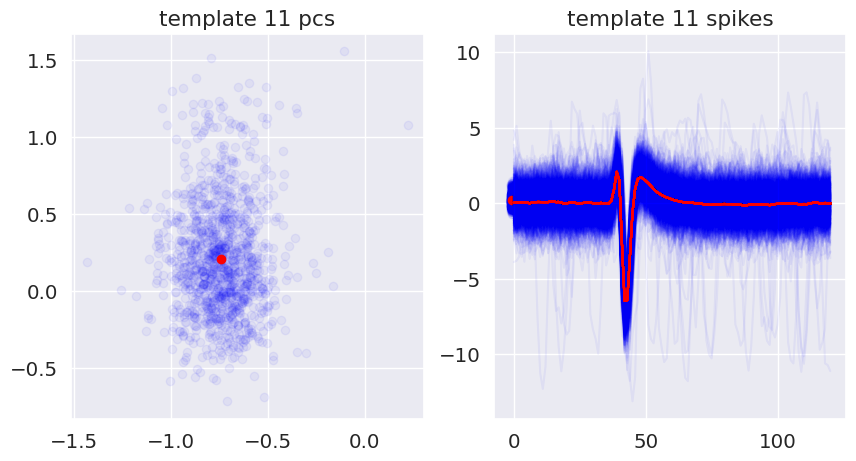

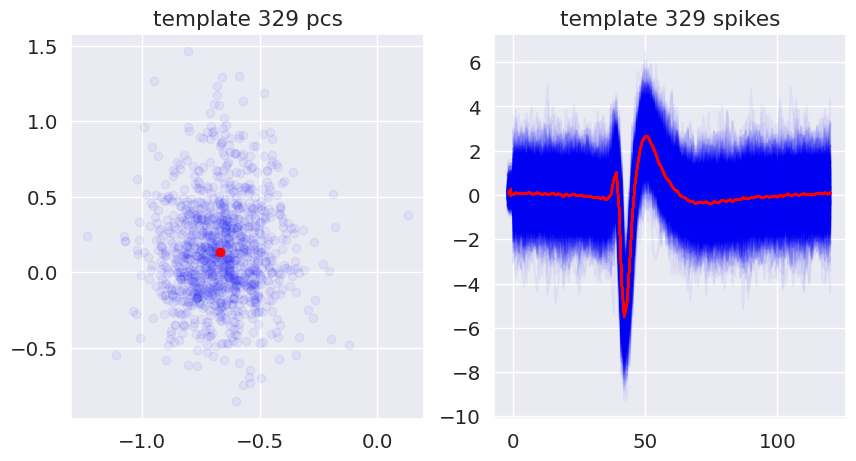

In [44]:
num_plot = 1200
units_plot = [1, 9]
for label_plot in units_plot:#range(len(np.unique(labels_train))):
    fig, axes = plt.subplots(1,2,figsize=(10,5))
    pcs = pcs_train[np.where(labels_train==label_plot)][:num_plot]
    axes[0].scatter(pcs[:,0], pcs[:,1], color='blue', alpha=.05)
    axes[0].scatter(np.mean(pcs,0)[0], np.mean(pcs,0)[1], color='red', alpha=1)
    axes[1].scatter(pcs[:,0], pcs[:,1], color='blue', alpha=.05)
    axes[1].scatter(np.mean(pcs,0)[0], np.mean(pcs,0)[1], color='red', alpha=1)
    spikes = wfs_train[np.where(labels_train==label_plot)]
    for spike in spikes[:num_plot]:
        axes[1].plot(spike.flatten(), color='blue', alpha=.05)
        axes[1].plot(np.mean(spikes, 0).flatten(), color='red')
    axes[0].set_title(f'template {selected_units[label_plot]} pcs')
    axes[1].set_title(f'template {selected_units[label_plot]} spikes')
    plt.show()

In [223]:
X_pca = learn_manifold_umap(denoised_pcs_test, umap_dim=2, umap_min_dist=0.2, umap_metric='euclidean', umap_neighbors=10)
clustering = MeanShift(bandwidth=2, n_jobs=20).fit(X_pca)
labels_test_ms_pcs = clustering.predict(X_pca)
score = adjusted_rand_score(labels_test, labels_test_ms_pcs)*100

number of seeds: 3000
seeds/job: 151
using 20 cpus


[Parallel(n_jobs=20)]: Using backend LokyBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done   3 out of  20 | elapsed:   20.0s remaining:  1.9min
[Parallel(n_jobs=20)]: Done  14 out of  20 | elapsed:   24.7s remaining:   10.6s


predicting


[Parallel(n_jobs=20)]: Done  20 out of  20 | elapsed:   27.1s finished


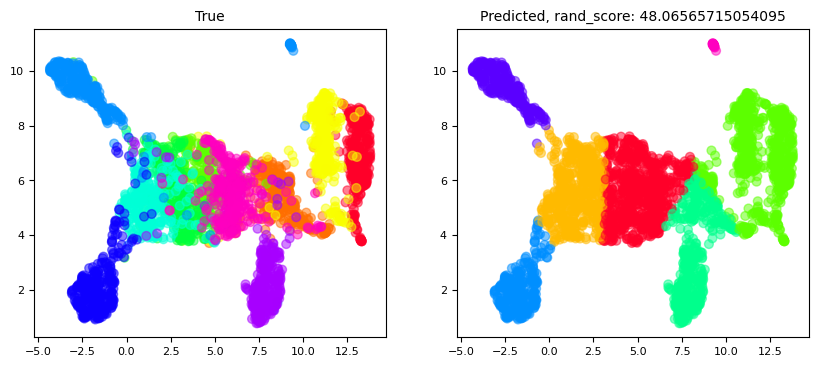

In [224]:
fig, axes = plt.subplots(1,2,figsize=(10,4))
# X = pcs_test
axes[0].scatter(X_pca[:, 0], X_pca[:, 1], c=labels_test, s=40, cmap='gist_rainbow', zorder=2, alpha=.5)
axes[1].scatter(X_pca[:, 0], X_pca[:, 1], c=labels_test_ms_pcs, s=40, cmap='gist_rainbow', zorder=2, alpha=.5)
axes[0].set_title('True')
axes[1].set_title(f'Predicted, rand_score: {score}');

In [71]:
reps_train = pcs_train
reps_test = pcs_test
for num_c in np.arange(2, denoised_pcs_train.shape[1]+1):
    gm = GaussianMixture(model_params['n_clusters'], 
                         random_state=0, 
                         covariance_type='full').fit(reps_train[:,:num_c])
    test_labels = gm.predict(reps_test[:,:num_c])
    score = adjusted_rand_score(labels_test, test_labels)*100
    print(f"num_comps: {num_c}, rand_score: {score}")

num_comps: 2, rand_score: 51.86089914696319
num_comps: 3, rand_score: 63.42369848143862
num_comps: 4, rand_score: 61.88944653728431
num_comps: 5, rand_score: 58.36880180978419
num_comps: 6, rand_score: 61.341115386493314
num_comps: 7, rand_score: 59.03326543900942
num_comps: 8, rand_score: 62.923237345998196
num_comps: 9, rand_score: 67.13956997337473
num_comps: 10, rand_score: 62.07962982569985
num_comps: 11, rand_score: 62.819179954212466
num_comps: 12, rand_score: 62.81706257288556
num_comps: 13, rand_score: 49.943828257211145
num_comps: 14, rand_score: 52.65677649300443
num_comps: 15, rand_score: 68.90455785792355
num_comps: 16, rand_score: 61.60542468764141
num_comps: 17, rand_score: 69.48138484846874
num_comps: 18, rand_score: 67.33510820397154
num_comps: 19, rand_score: 58.4900380008338
num_comps: 20, rand_score: 59.51118907547117


In [47]:
train_list = [pcs_train[:,:2], denoised_pcs_train[:,:2], pcs_train[:,:5], denoised_pcs_train[:,:5]]
test_list = [pcs_test[:,:2], denoised_pcs_test[:,:2], pcs_test[:,:5], denoised_pcs_test[:,:5]]

cluster_method = 'GMM'
models = [f'{cluster_method} Single-chan, num pcs: {train_list[0].shape[1]}', 
          f'{cluster_method} Denoised single-chan, num pcs: {train_list[1].shape[1]}',
          f'{cluster_method} Single-chan, num pcs: {train_list[2].shape[1]}',
          f'{cluster_method} Denoised single-chan, num pcs: {train_list[3].shape[1]}'] 

num_classes = len(np.unique(labels_test))
model_params = {'n_clusters':15, 'min_cluster_size':20}
per_class_map = per_class_accs(train_list, test_list, models, num_classes, cluster_method.lower(), unit_ids, model_params)
avg_class_map = avg_class_accs(train_list, test_list, models, num_classes, cluster_method.lower(), model_params)

pc_df = pd.DataFrame.from_dict(per_class_map, 'index')
ac_df = pd.DataFrame.from_dict(avg_class_map)

with pd.option_context('display.max_rows', None, 'display.max_columns', None):  # more options can be specified also
    display(pc_df)
    
with pd.option_context('display.max_rows', None, 'display.max_columns', None):  # more options can be specified also
    display(ac_df)

,wf 8,wf 9,wf 11,wf 13,wf 23,wf 24,wf 29,wf 30,wf 31,wf 32
"GMM Single-chan, num pcs: 2",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
"GMM Denoised single-chan, num pcs: 2",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
"GMM Single-chan, num pcs: 5",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
"GMM Denoised single-chan, num pcs: 5",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


,"GMM Single-chan, num pcs: 2","GMM Denoised single-chan, num pcs: 2","GMM Single-chan, num pcs: 5","GMM Denoised single-chan, num pcs: 5"
score,51.860899,40.873502,60.785662,48.298136


In [ ]:
mearec_denoised_wfs_train_locs.std(0).mean()

In [ ]:
mearec_exp_var = pca(np.array([mc.flatten() for mc in mearec_wfs_train]), 4)[1]
print(mearec_exp_var)
print(np.sum(mearec_exp_var))

Using projector; batchnorm False with depth 2
train done
pca test done
300
(3000,)
Using projector; batchnorm False with depth 2
train done
pca test done
300
(3000,)
Using projector; batchnorm False with depth 2
train done
pca test done
300
(3000,)
Using projector; batchnorm False with depth 2
train done
pca test done
300
(3000,)
Training process has finished.
Training process has finished.
Training process has finished.
Training process has finished.
Training process has finished.
Training process has finished.
Training process has finished.
Training process has finished.
Training process has finished.
Training process has finished.
Training process has finished.
Training process has finished.
Training process has finished.
Training process has finished.
Training process has finished.
Training process has finished.


,wf 8,wf 9,wf 11,wf 33,wf 65,wf 69,wf 109,wf 13,wf 329,wf 151
PCA 2D,100.0,99.333333,62.666667,82.333333,75.333333,49.000000,62.000000,88.666667,17.666667,63.000000
PCA 3D,100.0,98.666667,61.000000,92.333333,82.000000,46.666667,60.333333,93.000000,24.333333,67.333333
PCA 5D,100.0,98.666667,76.333333,92.000000,86.333333,43.000000,55.000000,92.000000,49.333333,79.000000
PCA 10D,100.0,96.000000,75.333333,93.000000,89.333333,53.000000,37.333333,97.000000,70.000000,88.333333
"Contrastive 2D (augs=amp/jit/noise, fc encoder)",100.0,97.333333,84.666667,91.666667,88.666667,51.333333,19.666667,95.666667,64.666667,92.333333
"Contrastive 3D (augs=amp/jit/noise, fc encoder)",100.0,96.333333,94.000000,95.333333,87.666667,44.666667,39.000000,96.000000,57.000000,89.666667
"Contrastive 5D (augs=amp/jit/noise, fc encoder)",100.0,98.000000,90.666667,93.666667,86.000000,48.000000,38.666667,93.666667,64.666667,94.666667
"Contrastive 10D (augs=amp/jit/noise, fc encoder)",100.0,98.000000,92.333333,94.000000,90.666667,47.333333,33.000000,94.666667,74.333333,93.333333


,PCA 2D,PCA 3D,PCA 5D,PCA 10D,"Contrastive 2D (augs=amp/jit/noise, fc encoder)","Contrastive 3D (augs=amp/jit/noise, fc encoder)","Contrastive 5D (augs=amp/jit/noise, fc encoder)","Contrastive 10D (augs=amp/jit/noise, fc encoder)"
score,69.966667,73.066667,76.933333,81.233333,78.433333,79.9,80.966667,81.566667


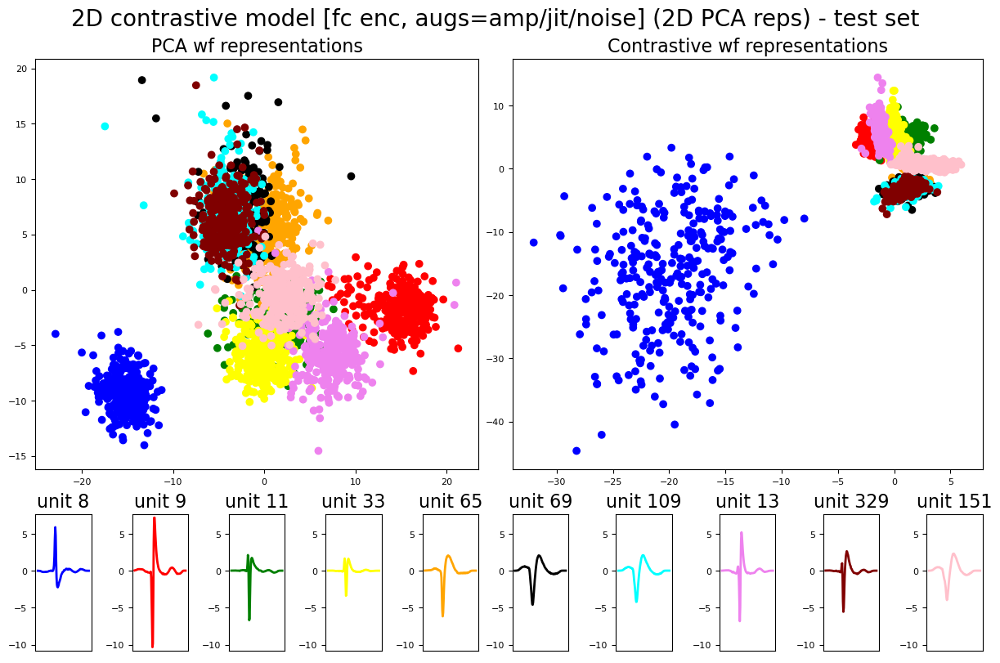

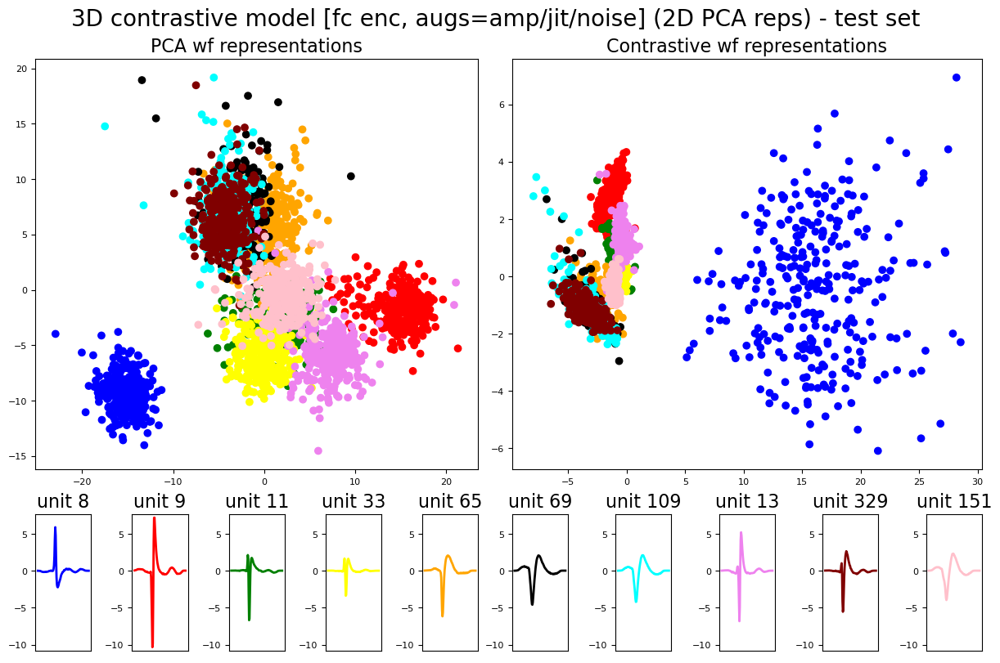

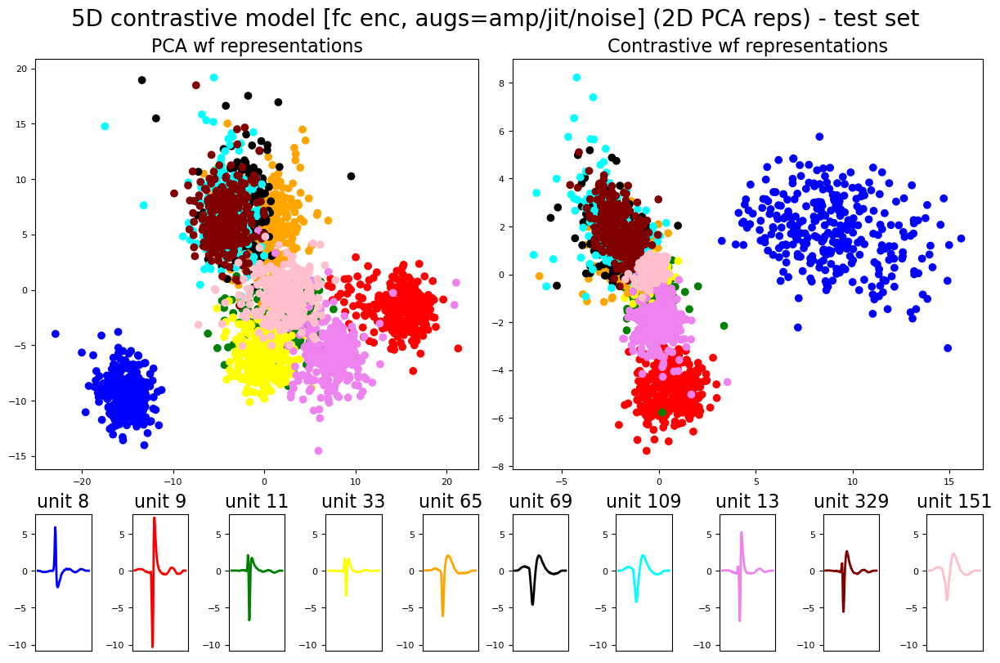

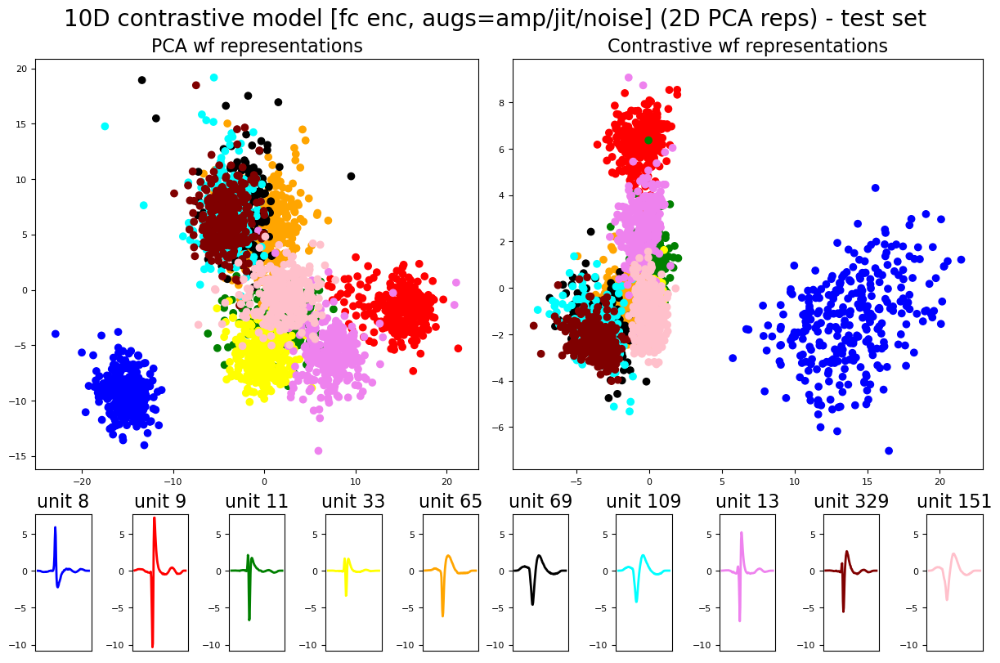

In [185]:
twod_norm_fcenc_path = '/Users/ankit/Documents/PaninskiLab/SimCLR-torch/runs/new_augs/fcenc-2d2d-normal-lr001/checkpoint_0400.pth.tar'
threed_norm_fcenc_path = '/Users/ankit/Documents/PaninskiLab/SimCLR-torch/runs/new_augs/fcenc-3d3d-normal-lr001/checkpoint_0400.pth.tar'
fived_norm_fcenc_path = '/Users/ankit/Documents/PaninskiLab/SimCLR-torch/runs/new_augs/fcenc-5d5d-normal/checkpoint_0500.pth.tar'
tend_norm_fcenc_path = '/Users/ankit/Documents/PaninskiLab/SimCLR-torch/runs/new_augs/fcenc-10d5d-normal-lr001/checkpoint_0400.pth.tar'


contr_reps_train_2d_n, contr_reps_test_2d_n, contr_reps_test_2d_pca_n, pca_train_2d, pca_test_2d = get_ckpt_results(twod_norm_fcenc_path, 2, dy_wfs_interest, dy_wfs_test, True, dy_wfs, wf_interest_dy, '2D contrastive model [fc enc, augs=amp/jit/noise] (2D PCA reps) - test set', enc_type='fc_encoder', Lv=[121, 550, 1100, 250], save_name='pca_v_2dcont_normal_fcenc')
contr_reps_train_3d_n, contr_reps_test_3d_n, contr_reps_test_3d_pca_n, pca_train_3d, pca_test_3d = get_ckpt_results(threed_norm_fcenc_path, 3, dy_wfs_interest, dy_wfs_test, True, dy_wfs, wf_interest_dy, '3D contrastive model [fc enc, augs=amp/jit/noise] (2D PCA reps) - test set', enc_type='fc_encoder', Lv=[121, 550, 1100, 250], save_name='pca_v_3dcont_normal_fcenc')
contr_reps_train_5d_n, contr_reps_test_5d_n, contr_reps_test_5d_pca_n, pca_train_5d, pca_test_5d = get_ckpt_results(fived_norm_fcenc_path, 5, dy_wfs_interest, dy_wfs_test, True, dy_wfs, wf_interest_dy, '5D contrastive model [fc enc, augs=amp/jit/noise] (2D PCA reps) - test set', enc_type='fc_encoder', Lv=[121, 550, 1100, 250], save_name='pca_v_5dcont_normal_fcenc')
contr_reps_train_10d_n, contr_reps_test_10d_n, contr_reps_test_10d_pca_n, pca_train_10d, pca_test_10d = get_ckpt_results(tend_norm_fcenc_path, 10, dy_wfs_interest, dy_wfs_test, True, dy_wfs, wf_interest_dy, '10D contrastive model [fc enc, augs=amp/jit/noise] (2D PCA reps) - test set', enc_type='fc_encoder', Lv=[121, 550, 1100, 250], save_name='pca_v_10dcont_normal_fcenc')


train_reps = [pca_train_2d, pca_train_3d, pca_train_5d, pca_train_10d, 
              contr_reps_train_2d_n, contr_reps_train_3d_n, contr_reps_train_5d_n, 
              contr_reps_train_10d_n]
test_reps = [pca_test_2d, pca_test_3d, pca_test_5d, pca_test_10d,
             contr_reps_test_2d_n, contr_reps_test_3d_n, contr_reps_test_5d_n, 
             contr_reps_test_10d_n]
models = ['PCA 2D', 'PCA 3D', 'PCA 5D', 'PCA 10D',
          'Contrastive 2D (augs=amp/jit/noise, fc encoder)', 'Contrastive 3D (augs=amp/jit/noise, fc encoder)',
          'Contrastive 5D (augs=amp/jit/noise, fc encoder)', 'Contrastive 10D (augs=amp/jit/noise, fc encoder)']


per_class_map = per_class_accs(train_reps, test_reps, models, 10)
avg_class_map = avg_class_accs(train_reps, test_reps, models, 10)

pc_df = pd.DataFrame.from_dict(per_class_map, 'index')
ac_df = pd.DataFrame.from_dict(avg_class_map)

with pd.option_context('display.max_rows', None, 'display.max_columns', None):  # more options can be specified also
    display(pc_df)
    
with pd.option_context('display.max_rows', None, 'display.max_columns', None):  # more options can be specified also
    display(ac_df)

In [58]:
train_reps = [pca_train_2d, pca_train_5d, pca_train_10d, pca_train_20d, contr_reps_train_2d, contr_reps_train_5d, contr_reps_train_10d, contr_reps_train_20d]
test_reps = [pca_test_2d, pca_test_5d, pca_test_10d, pca_test_20d, contr_reps_2d, contr_reps_5d, contr_reps_10d, contr_reps_20d]
models = ['PCA 2D', 'PCA 5D', 'PCA 10D', 'PCA 20D', 'Contrastive 2D (lr=0.001)', 'Contrastive 5D (lr=0.001)', 'Contrastive 10D (lr=0.001)', 'Contrastive 20D (lr=0.001)']

per_class_map = per_class_accs(train_reps, test_reps, models, 10)
avg_class_map = avg_class_accs(train_reps, test_reps, models, 10)

Starting epoch 1
Starting epoch 2
Starting epoch 3
Starting epoch 4
Starting epoch 5
Starting epoch 6
Starting epoch 7
Starting epoch 8
Starting epoch 9
Starting epoch 10
Starting epoch 11
Starting epoch 12
Starting epoch 13
Starting epoch 14
Starting epoch 15
Starting epoch 16
Starting epoch 17
Starting epoch 18
Starting epoch 19
Starting epoch 20
Starting epoch 21
Starting epoch 22
Starting epoch 23
Starting epoch 24
Starting epoch 25
Starting epoch 26
Starting epoch 27
Starting epoch 28
Starting epoch 29
Starting epoch 30
Starting epoch 31
Starting epoch 32
Starting epoch 33
Starting epoch 34
Starting epoch 35
Starting epoch 36
Starting epoch 37
Starting epoch 38
Starting epoch 39
Starting epoch 40
Starting epoch 41
Starting epoch 42
Starting epoch 43
Starting epoch 44
Starting epoch 45
Starting epoch 46
Starting epoch 47
Starting epoch 48
Starting epoch 49
Starting epoch 50
Starting epoch 51
Starting epoch 52
Starting epoch 53
Starting epoch 54
Starting epoch 55
Starting epoch 56
S

In [59]:
pc_df = pd.DataFrame.from_dict(per_class_map, 'index')
ac_df = pd.DataFrame.from_dict(avg_class_map)

In [60]:
# pd.set_option('display.max_rows', 10)
# display(pc_df)
with pd.option_context('display.max_rows', None, 'display.max_columns', None):  # more options can be specified also
    display(pc_df)

,wf 8,wf 9,wf 11,wf 33,wf 65,wf 69,wf 109,wf 13,wf 329,wf 151
PCA 2D,100.000000,98.666667,48.666667,84.333333,75.000000,61.000000,0.000000,91.666667,66.000000,70.333333
PCA 5D,100.000000,99.333333,75.000000,92.666667,85.333333,42.000000,53.333333,91.000000,50.333333,80.000000
PCA 10D,99.666667,98.666667,82.666667,93.333333,90.666667,55.000000,50.666667,94.000000,57.666667,85.000000
PCA 20D,100.000000,95.000000,84.666667,93.000000,92.000000,51.333333,46.333333,94.333333,69.000000,86.000000
Contrastive 2D (lr=0.001),97.333333,86.000000,74.666667,62.333333,85.333333,43.666667,26.666667,74.666667,49.000000,77.666667
Contrastive 5D (lr=0.001),100.000000,95.666667,90.666667,86.666667,88.000000,59.333333,26.333333,78.666667,69.333333,90.666667
Contrastive 10D (lr=0.001),100.000000,94.333333,86.666667,79.666667,86.000000,60.000000,25.333333,79.000000,62.666667,87.333333
Contrastive 20D (lr=0.001),100.000000,92.666667,87.000000,82.666667,85.666667,44.000000,40.000000,86.000000,62.333333,83.333333


In [61]:
# pd.set_option('display.max_rows', 10)
# display(pc_df)
with pd.option_context('display.max_rows', None, 'display.max_columns', None):  # more options can be specified also
    display(ac_df)

,PCA 2D,PCA 5D,PCA 10D,PCA 20D,Contrastive 2D (lr=0.001),Contrastive 5D (lr=0.001),Contrastive 10D (lr=0.001),Contrastive 20D (lr=0.001)
score,69.766667,76.966667,80.566667,81.0,67.7,77.933333,76.033333,76.866667


Using projector; batchnorm False with depth 2
train done
pca test done
300
(3000,)
Using projector; batchnorm False with depth 2
train done
pca test done
300
(3000,)
Using projector; batchnorm False with depth 2
train done
pca test done
300
(3000,)
Training process has finished.
Training process has finished.
Training process has finished.
Training process has finished.
Training process has finished.
Training process has finished.
Training process has finished.
Training process has finished.
Training process has finished.
Training process has finished.


,wf 8,wf 9,wf 11,wf 33,wf 65,wf 69,wf 109,wf 13,wf 329,wf 151
PCA 10D,100.000000,97.333333,78.666667,93.000000,86.333333,58.000000,32.666667,94.666667,69.333333,87.666667
PCA 20D,99.666667,96.333333,85.333333,92.000000,90.333333,52.666667,58.666667,92.333333,58.000000,83.333333
Contrastive 10D (lr=0.001),100.000000,93.000000,89.666667,83.333333,89.333333,51.666667,29.000000,85.333333,65.333333,88.000000
Contrastive 10D (lr=0.005),100.000000,92.000000,86.666667,82.333333,78.666667,54.333333,23.000000,84.000000,65.333333,82.333333
Contrastive 20D (lr=0.001),99.666667,94.333333,90.333333,87.000000,85.666667,53.333333,41.666667,89.333333,58.000000,86.333333


,PCA 10D,PCA 20D,Contrastive 10D (lr=0.001),Contrastive 10D (lr=0.005),Contrastive 20D (lr=0.001)
score,80.7,80.766667,77.1,74.433333,78.4


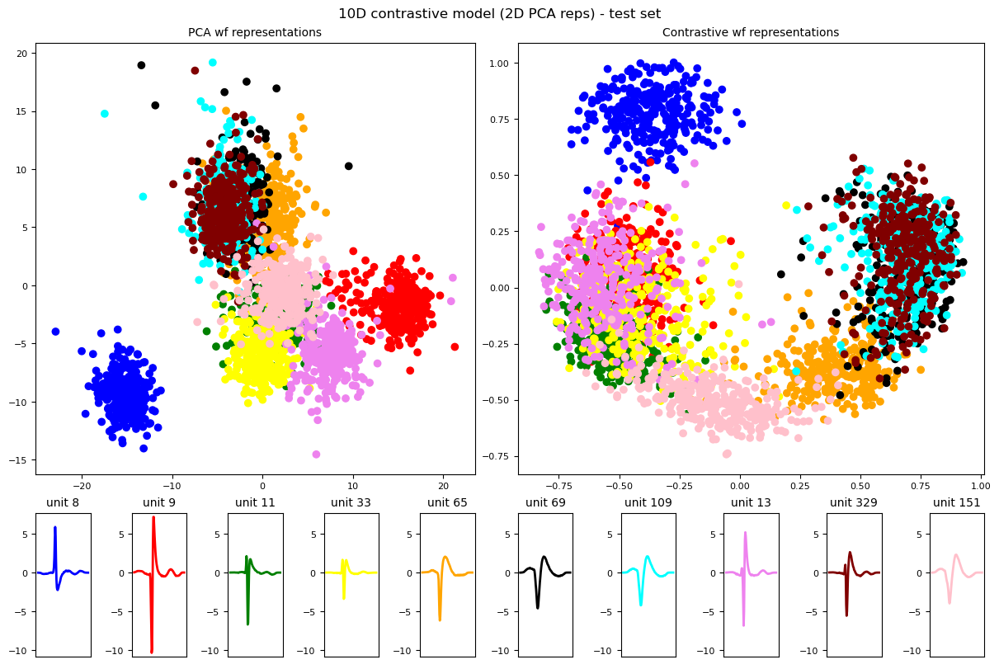

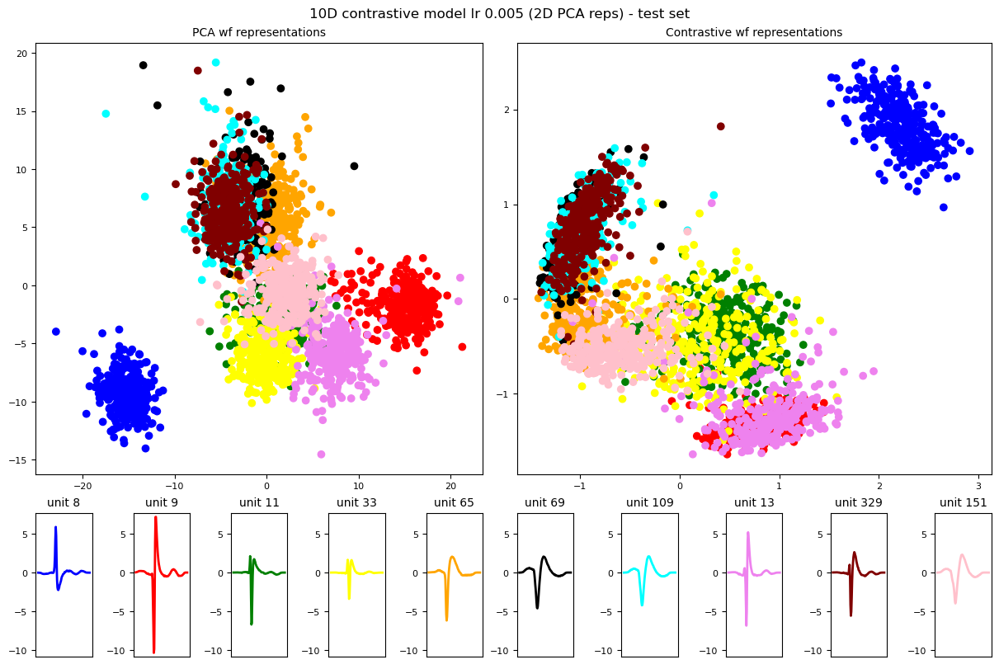

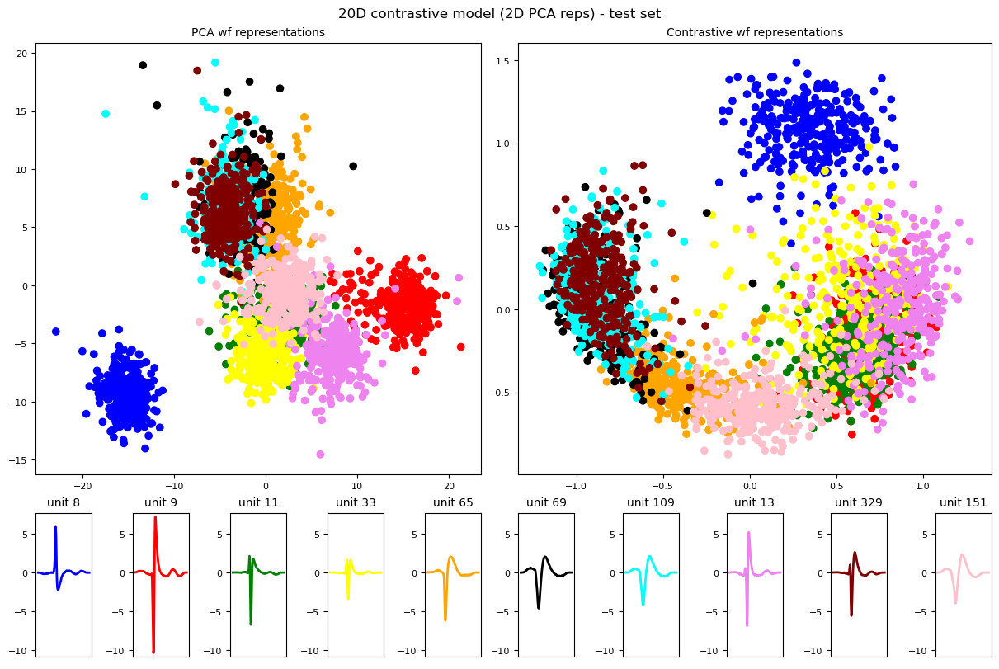

In [98]:
tend_enc_path = '/Users/ankit/Documents/PaninskiLab/SimCLR-torch/runs/proj_dim_5/enc-10d-pd-lr001/checkpoint_1000.pth.tar'
twentyd_enc_path = '/Users/ankit/Documents/PaninskiLab/SimCLR-torch/runs/proj_dim_5/enc-20d-pd-lr001/checkpoint_1000.pth.tar'
tend_lr_enc_path = '/Users/ankit/Documents/PaninskiLab/SimCLR-torch/runs/proj_dim_5/enc-10d-pd-lr005/checkpoint_1000.pth.tar'

contr_reps_train_10d, contr_reps_test_10d, contr_reps_test_10d_pca, pca_train_10d, pca_test_10d = get_ckpt_results(tend_enc_path, 10, dy_wfs_interest, dy_wfs_test, True, dy_wfs, wf_interest_dy, '10D contrastive model (2D PCA reps) - test set', save_name='pca_v_10dcont_pjlr001_sdv4')
contr_reps_train_10d_lr, contr_reps_test_10d_lr, contr_reps_test_10d_lr_pca, _, _ = get_ckpt_results(tend_lr_enc_path, 10, dy_wfs_interest, dy_wfs_test, True, dy_wfs, wf_interest_dy, '10D contrastive model lr 0.005 (2D PCA reps) - test set', save_name='pca_v_10dcont_pjlr005_sdv4')
contr_reps_train_20d, contr_reps_test_20d, contr_reps_test_20d_pca, pca_train_20d, pca_test_20d = get_ckpt_results(twentyd_enc_path, 20, dy_wfs_interest, dy_wfs_test, True, dy_wfs, wf_interest_dy, '20D contrastive model (2D PCA reps) - test set', save_name='pca_v_20dcont_pjlr001_sdv4')

train_reps = [pca_train_10d, pca_train_20d, contr_reps_train_10d, contr_reps_train_10d_lr, contr_reps_train_20d]
test_reps = [pca_test_10d, pca_test_20d, contr_reps_test_10d, contr_reps_test_10d_lr, contr_reps_test_20d]
models = ['PCA 10D', 'PCA 20D', 'Contrastive 10D (lr=0.001)', 'Contrastive 10D (lr=0.005)', 'Contrastive 20D (lr=0.001)']

per_class_map = per_class_accs(train_reps, test_reps, models, 10)
avg_class_map = avg_class_accs(train_reps, test_reps, models, 10)

pc_df = pd.DataFrame.from_dict(per_class_map, 'index')
ac_df = pd.DataFrame.from_dict(avg_class_map)

with pd.option_context('display.max_rows', None, 'display.max_columns', None):  # more options can be specified also
    display(pc_df)
    
with pd.option_context('display.max_rows', None, 'display.max_columns', None):  # more options can be specified also
    display(ac_df)

Using projector; batchnorm False with depth 2
train done
pca test done
300
(3000,)
Using projector; batchnorm False with depth 2
train done
pca test done
300
(3000,)
Using projector; batchnorm False with depth 2
train done
pca test done
300
(3000,)
Training process has finished.
Training process has finished.
Training process has finished.
Training process has finished.
Training process has finished.
Training process has finished.
Training process has finished.
Training process has finished.
Training process has finished.
Training process has finished.


,wf 8,wf 9,wf 11,wf 33,wf 65,wf 69,wf 109,wf 13,wf 329,wf 151
PCA 10D,100.000000,99.000000,80.333333,92.333333,87.333333,53.000000,52.000000,94.666667,62.000000,87.333333
PCA 20D,100.000000,96.333333,82.000000,92.333333,87.666667,39.333333,51.666667,93.000000,54.666667,85.666667
Contrastive 10D (lr=0.001),100.000000,92.666667,89.000000,84.000000,89.333333,57.000000,30.666667,85.000000,57.333333,87.666667
"Contrastive 10D (lr=0.001, noise/collision on)",100.000000,96.666667,89.666667,81.333333,83.333333,27.000000,48.000000,89.333333,69.333333,88.333333
Contrastive 20D (lr=0.001),99.666667,95.666667,90.333333,84.000000,85.333333,51.333333,37.666667,88.000000,65.333333,90.666667


,PCA 10D,PCA 20D,Contrastive 10D (lr=0.001),"Contrastive 10D (lr=0.001, noise/collision on)",Contrastive 20D (lr=0.001)
score,80.133333,77.733333,77.366667,77.133333,78.766667


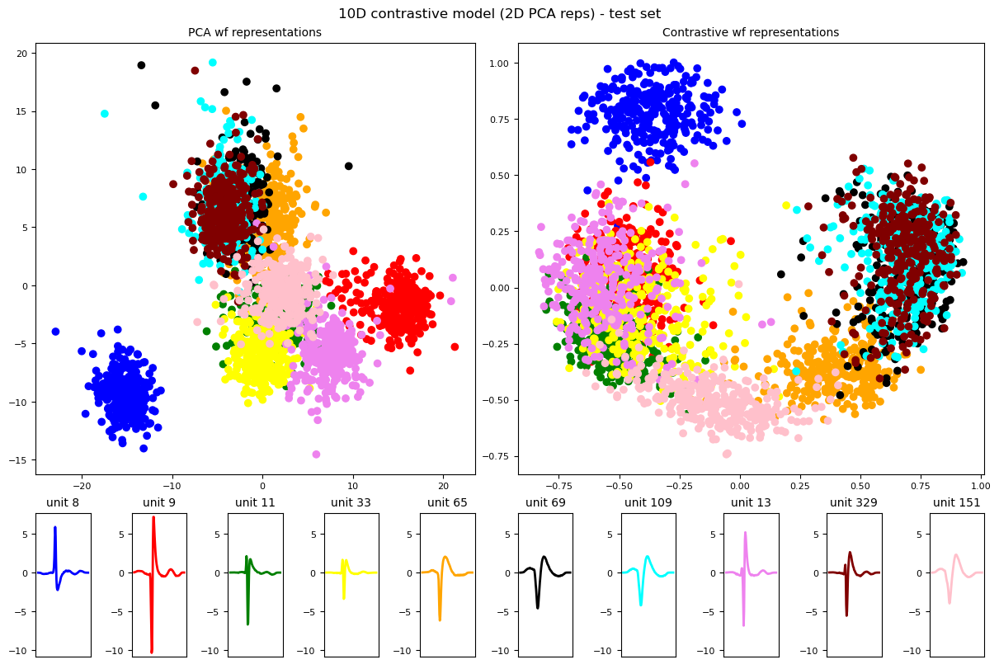

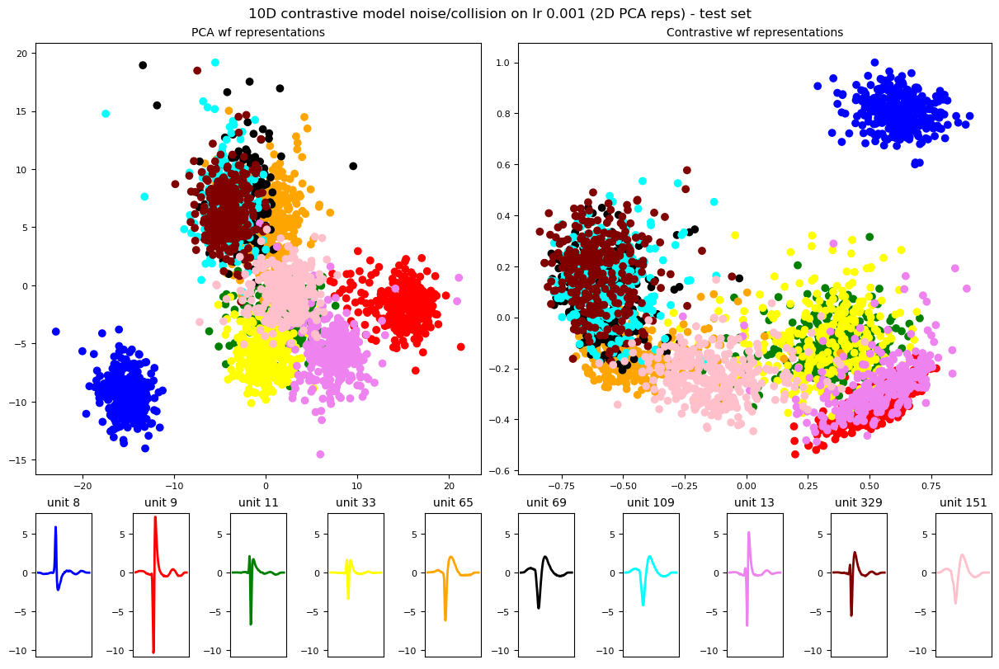

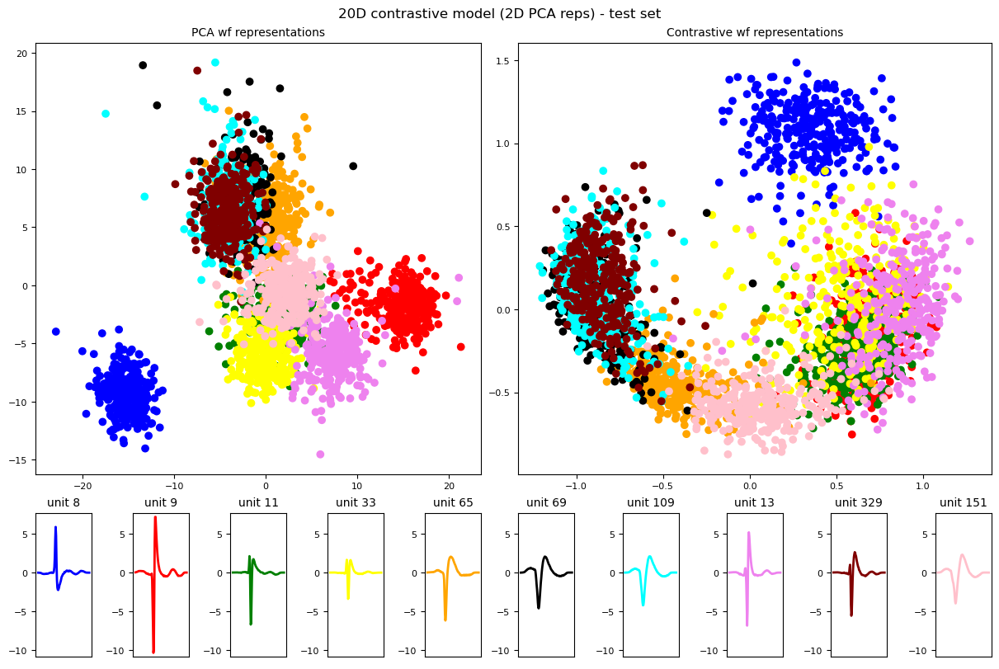

In [51]:
tend_enc_path = '/Users/ankit/Documents/PaninskiLab/SimCLR-torch/runs/proj_dim_5/enc-10d-pd-lr001/checkpoint_1000.pth.tar'
twentyd_enc_path = '/Users/ankit/Documents/PaninskiLab/SimCLR-torch/runs/proj_dim_5/enc-20d-pd-lr001/checkpoint_1000.pth.tar'
tend_na_enc_path = '/Users/ankit/Documents/PaninskiLab/SimCLR-torch/runs/new_augs/enc-10d-lr001/checkpoint_1000.pth.tar'

contr_reps_train_10d, contr_reps_test_10d, contr_reps_test_10d_pca, pca_train_10d, pca_test_10d = get_ckpt_results(tend_enc_path, 10, dy_wfs_interest, dy_wfs_test, True, dy_wfs, wf_interest_dy, '10D contrastive model (2D PCA reps) - test set', save_name='pca_v_10dcont_pjlr001_sdv4')
contr_reps_train_10d_na, contr_reps_test_10d_na, contr_reps_test_10d_na_pca, _, _ = get_ckpt_results(tend_na_enc_path, 10, dy_wfs_interest, dy_wfs_test, True, dy_wfs, wf_interest_dy, '10D contrastive model noise/collision on lr 0.001 (2D PCA reps) - test set', save_name='pca_v_10dcont_pjlr005_ua_sdv4')
contr_reps_train_20d, contr_reps_test_20d, contr_reps_test_20d_pca, pca_train_20d, pca_test_20d = get_ckpt_results(twentyd_enc_path, 20, dy_wfs_interest, dy_wfs_test, True, dy_wfs, wf_interest_dy, '20D contrastive model (2D PCA reps) - test set', save_name='pca_v_20dcont_pjlr001_sdv4')

train_reps = [pca_train_10d, pca_train_20d, contr_reps_train_10d, contr_reps_train_10d_na, contr_reps_train_20d]
test_reps = [pca_test_10d, pca_test_20d, contr_reps_test_10d, contr_reps_test_10d_na, contr_reps_test_20d]
models = ['PCA 10D', 'PCA 20D', 'Contrastive 10D (lr=0.001)', 'Contrastive 10D (lr=0.001, noise/collision on)', 'Contrastive 20D (lr=0.001)']

per_class_map = per_class_accs(train_reps, test_reps, models, 10)
avg_class_map = avg_class_accs(train_reps, test_reps, models, 10)

pc_df = pd.DataFrame.from_dict(per_class_map, 'index')
ac_df = pd.DataFrame.from_dict(avg_class_map)

with pd.option_context('display.max_rows', None, 'display.max_columns', None):  # more options can be specified also
    display(pc_df)
    
with pd.option_context('display.max_rows', None, 'display.max_columns', None):  # more options can be specified also
    display(ac_df)